<center><font size=5>Capstone Project  </font></center>

 <center><font size=6>German Traffic Sign Recognition</font></center>

# Part 2 : Modelling

**Highlights from the EDA (Part 1) :**

- 50,000+ labeled images
- 43 classes
- Each class has at least 270 images 
- On average, the dimension of an image is 50*50 pixels

## General preprocessing

### Import libraries

In [1]:
# Basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import os

# sklearn library
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

# import tensorflow and keras libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model


# Import pretrained models
#Resnet50
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications import resnet50

#VGG16
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import vgg16

#MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications import mobilenet_v2

#DenseNet121
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications import densenet

#NASNetMobile
from tensorflow.keras.applications.nasnet import NASNetMobile
from tensorflow.keras.applications import nasnet

#EfficientNetB0
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.applications import efficientnet

#EfficientNetV2B0
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2B0
from tensorflow.keras.applications import efficientnet_v2

### Set the GPU

In [2]:
# Test if the GPU will comput
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [3]:
#Set the memory limit for the GPU otherwise it may be out of ressource et return an error
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only allocate 3GB of memory on the first GPU
    try:
        tf.config.set_logical_device_configuration(
            gpus[0],
            [tf.config.LogicalDeviceConfiguration(memory_limit=3072)])
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
    # Virtual devices must be set before GPUs have been initialized
        print(e)


1 Physical GPUs, 1 Logical GPUs


In [4]:
#Set the saveOption to local host otherwise the model may save into the GPU
localhost_save_option = tf.saved_model.SaveOptions(experimental_io_device="/job:localhost")

### Load the data

In [5]:
full_df=pd.read_pickle('./full_df.pkl')
full_df.head()

,ClassId,Path,Class
0,20,Train/20/00020_00000_00000.png,Dangerous curve right
1,20,Train/20/00020_00000_00001.png,Dangerous curve right
2,20,Train/20/00020_00000_00002.png,Dangerous curve right
3,20,Train/20/00020_00000_00003.png,Dangerous curve right
4,20,Train/20/00020_00000_00004.png,Dangerous curve right


### Define the classes

In [6]:
classes = {
    0: 'Speed limit (20km/h)',
    1: 'Speed limit (30km/h)',
    2: 'Speed limit (50km/h)',
    3: 'Speed limit (60km/h)',
    4: 'Speed limit (70km/h)',
    5: 'Speed limit (80km/h)',
    6: 'End of speed limit (80km/h)',
    7: 'Speed limit (100km/h)',
    8: 'Speed limit (120km/h)',
    9: 'No passing',
    10: 'No passing veh over 3.5 tons',
    11: 'Right-of-way at intersection',
    12: 'Priority road',
    13: 'Yield',
    14: 'Stop',
    15: 'No vehicles',
    16: 'Veh > 3.5 tons prohibited',
    17: 'No entry',
    18: 'General caution',
    19: 'Dangerous curve left',
    20: 'Dangerous curve right',
    21: 'Double curve',
    22: 'Bumpy road',
    23: 'Slippery road',
    24: 'Road narrows on the right',
    25: 'Road work',
    26: 'Traffic signals',
    27: 'Pedestrians',
    28: 'Children crossing',
    29: 'Bicycles crossing',
    30: 'Beware of ice/snow',
    31: 'Wild animals crossing',
    32: 'End speed + passing limits',
    33: 'Turn right ahead',
    34: 'Turn left ahead',
    35: 'Ahead only',
    36: 'Go straight or right',
    37: 'Go straight or left',
    38: 'Keep right',
    39: 'Keep left',
    40: 'Roundabout mandatory',
    41: 'End of no passing',
    42: 'End no passing veh > 3.5 tons'
}

l_classes = list(classes.keys())
nb_classes = len(l_classes)

### Initialize the variables

In [7]:
# Target size of each image
width_im = 50
height_im = 50
image_size = (width_im, height_im)

# Size of the batch
batch_size = 16

#Number of epoch
nb_epoch=20

# Results Dataframes 
df_train_accuracy=pd.DataFrame()
df_train_loss=pd.DataFrame()

# List of accuracy for the test set
dict_acc={}

### Set the features/target

In [8]:
#set the features
X=full_df['Path']
# Set the target
Y=full_df['ClassId']

### Check the data

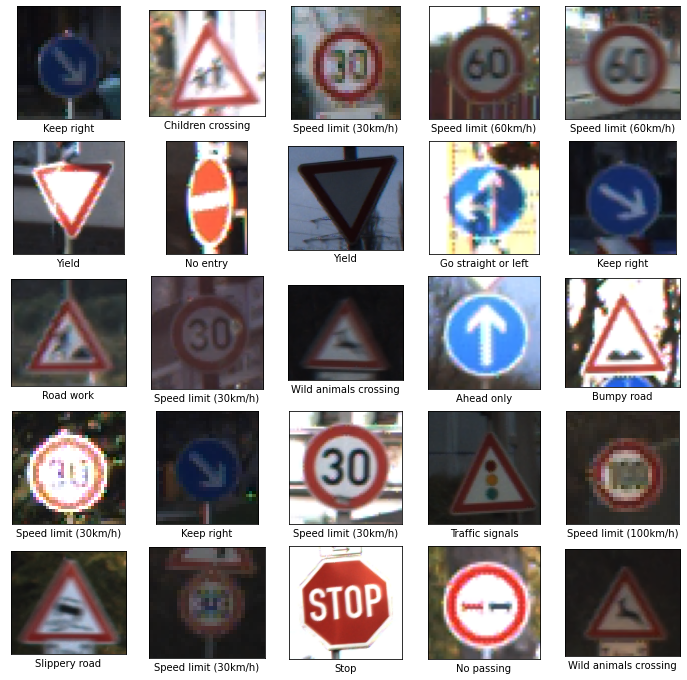

In [9]:
plt.figure(figsize=(12,12))
rndm_idx = np.random.randint(0, X.shape[0], 25)
for i, image_index in enumerate(rndm_idx):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(plt.imread(X[image_index]))
    plt.xlabel(classes[Y[image_index]])
plt.show()

### Split the data

In [10]:
# Split the datasets into training set and test set 
train_paths, test_paths, train_labels, test_labels = train_test_split(X, Y, test_size=0.25, random_state=42)

train_paths, test_paths= np.array(train_paths), np.array(test_paths)
train_labels, test_labels =np.array(train_labels), np.array(test_labels)

train_labels_cat = to_categorical(train_labels,num_classes=nb_classes)
test_labels_cat = to_categorical(test_labels,num_classes=nb_classes)

### Functions

#### Plot the accuracy et loss between the training set and the validation set

In [11]:
def plot_acc_Train_Val(history):
    
    """
    
    Plot the accuracy et loss between the training set and the validation set 
    
    """
#Function copied from the IOD lab 9  

    fig, ax = plt.subplots(1, 2, figsize=(18, 6))
    fig.subplots_adjust(left=0.02, right=0.98, wspace=0.2)

    plt.rcParams.update({'font.size': 16})

    # Plot training & validation accuracy values
    ax[0].plot(history['accuracy'], label='Training')
    ax[0].plot(history['val_accuracy'], label='Validation')
    ax[0].set_title(f'{n_model} {nb_epoch} epochs accuracy')
    ax[0].set_ylabel('Accuracy',size=15)
    ax[0].set_xlabel('Epoch',size=15)
    ax[0].legend()

    # Plot training & validation loss values
    ax[1].plot(history['loss'], label='Training')
    ax[1].plot(history['val_loss'], label='Validation')
    ax[1].set_title(f'{n_model} {nb_epoch} epochs loss')
    ax[1].set_ylabel('Loss',size=15)
    ax[1].set_xlabel('Epoch',size=15)
    ax[1].legend()

    plt.show()

#### Display the confusion matrice and the classification report

In [12]:
def plot_cm_report(y_pred_class):
    
    """
    
    Display the confusion matrice and the classification report
    
    """
    #Change numerical predictions to their classe name  
    test_labels_name=[classes[x] for x in test_labels]
    y_pred_class_name=[classes[x] for x in y_pred_class]
    
    #Compute the confusion matrix
    cm = confusion_matrix(test_labels_name, y_pred_class_name, labels=list(classes.values()))
    
    #Display the confusion matrix of the test set
    disp = ConfusionMatrixDisplay(cm, display_labels=list(classes.values()))
    fig, ax = plt.subplots(figsize=(15, 15))
    disp.plot(ax=ax,include_values=False)
    plt.title(f'Confusion matrix of the test set for {n_model}')
    plt.xticks(rotation=90)
    plt.show()

    #Print the classification report
    print(classification_report(test_labels_name, y_pred_class_name,labels=list(classes.values())))

#### Display 25 images with wrong predictions

In [13]:
def plot_25im_prdct(y_pred_class):
    
    """
    Display 25 images with wrong predictions
    
    """
    # Function partially extracted from the IOD lab 9 then modified to display only the bad predictions
    
    plt.figure(figsize=(15, 15))
    image_index=0
    i=0
    while i<25 : # Do until we have 25 wrong predictions
        #Check if the prediction is different from the true label
        if test_labels[image_index] != y_pred_class[image_index]:
            
            plt.subplot(5, 5, i + 1)
            plt.subplots_adjust(left=0.02, right=0.98, wspace=0.2, hspace=0.3)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.imshow(plt.imread(test_paths[image_index]))
            plt.xlabel(classes[test_labels[image_index]],size=12)
            plt.title(f'Pred: {classes[y_pred_class[image_index]]}',size=12)
            i=i+1
        image_index=image_index+1
    plt.show()

#### Load/(Compile, fit,save) , predict and plot the model

In [14]:
def compile_fit_predict_plot(model, plotcm=True, plot_sample=True):
    """
    
    Load/(Compile, fit,save) , predict and plot the model
    
    """
    
    #Function created from scratch
    
    #Check if the model and history already exist for the number of epoch
    if os.path.exists(
            f'./Models/{n_model}_{nb_epoch}_epochs.h5') & os.path.exists(
                f"./History/history_{n_model}_{nb_epoch}_epochs.pkl"):
        
        print('Loading the model...')
        #Load the model
        model = load_model(f'./Models/{n_model}_{nb_epoch}_epochs.h5',options=localhost_save_option)
        
        #Load the history (accuracy and loss)
        with open(f"./History/history_{n_model}_{nb_epoch}_epochs.pkl",
                  "rb") as file:  #Pickling
            history=pickle.load(file)

    else:
        print('Compiling and fitting the model...')
        #Compile
        model.compile(optimizer='adam',
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])
        
        #Fit and extract the history 
        history = model.fit(train_images,
                            train_labels_cat,
                            epochs=nb_epoch,
                            validation_split=0.1)
        #Save the model
#         model.save(f'./Models/{n_model}_{nb_epoch}_epochs.h5',options=localhost_save_option)
        
        
        #Pickle the history
        history=history.history
        with open(f"./History/history_{n_model}_{nb_epoch}_epochs.pkl",
                  "wb") as file:  #Pickling
            pickle.dump(history, file)
            
    #END IF os.path.exists

    # Plot accuracy and loss of the training and validation sets per epoch
    plot_acc_Train_Val(history)

    # Predict the test set
    print('Predictions')
    predict = model.predict(test_images)
    y_pred_class = predict.argmax(axis=-1)

    # Plot the confusion matrice
    if plot_cm_report: plot_cm_report(y_pred_class)

    #Plot 25 image where the prediction is wrong
    if plot_sample: plot_25im_prdct(y_pred_class)

    #Create Dataframe of history : loss
    df_loss_model = pd.DataFrame(history)[['loss',
                          'val_loss']].rename(columns={
                              'loss': f'{n_model}_loss',
                              'val_loss': f'{n_model}_val_loss'
                          })

    #Create Dataframe of history : accuracy
    df_acc_model = pd.DataFrame(history)[['accuracy', 'val_accuracy']].rename(
            columns={
                'accuracy': f'{n_model}_accuracy',
                'val_accuracy': f'{n_model}_val_accuracy'
            })
    
    #Evaluate the test set and return the accuracy 
    test_acc = model.evaluate(test_images, test_labels_cat)[1]

    return df_acc_model, df_loss_model, round(test_acc, 3)

## Modelling

For the modelling part, we tried 15 differents convolution models :

- Simple model (3 convolution layers)
- ResNet50 (with/without pretrained weights)
- VGG16 (with/without pretrained weights)
- MobileNetV2 (with/without pretrained weights)
- DensenetV2 (with/without pretrained weights)
- NASNetMobile (with/without pretrained weights)
- EfficientNetB0 (with/without pretrained weights)
- EfficientNetV2B0 (with/without pretrained weights)


4 steps for modelling each model

**1. Preprocessing**

A proper preprocessus is required for each model to transform an image into numbers.
Moreover, a Convolution Neural Network (CNN) needs always the same number amount of inputs (in our case pixels).
Therefore, we resize each image to match a dimension of 50*50 pixels (average size of all the images). 

**2. Define the model**

Define each layer of the model (Dense, Conv2D, MaxPooling,....) with some specific parameters (dimensionality, activation function, size of the filter, ...).

**3. Compile/fit the model**

This part is the longuest part of this project. Once the data is completely preprocessed and the model well define, it's time to compile the model and to fit it. The CPU (and GPU for our case) will start the compute to calc best best weights to minimize the loss.

**4. Evaluate the model**

When the fitting is finish, let's evaluate if the model is well trained to predict correctly unseen data (our validation set) 

### Simple model

#### Preprocessing

In [15]:
def im2array(path):
    img = image.load_img(path, target_size=image_size) #load and resize
    x = image.img_to_array(img) #Value rgb between 0 and 255
    return list(x/255.0)

In [16]:
%%time
#Convert and resize image to array (value between 0 and 1)
train_images=np.array([im2array(path) for path in list(train_paths)])
test_images=np.array([im2array(path) for path in list(test_paths)])

CPU times: total: 3.66 s
Wall time: 28.8 s


In [17]:
#Define the model
n_model='Simple_model'
model = Sequential()
model.add(layers.Conv2D(48, (3, 3), activation='relu', input_shape=(width_im, height_im, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(nb_classes,activation='softmax'))

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 48)        1344      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 24, 24, 48)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 22, 22, 64)        27712     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 11, 11, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 9, 9, 64)          36928     
                                                                 
 flatten (Flatten)           (None, 5184)              0

#### Evaluation

Loading the model...


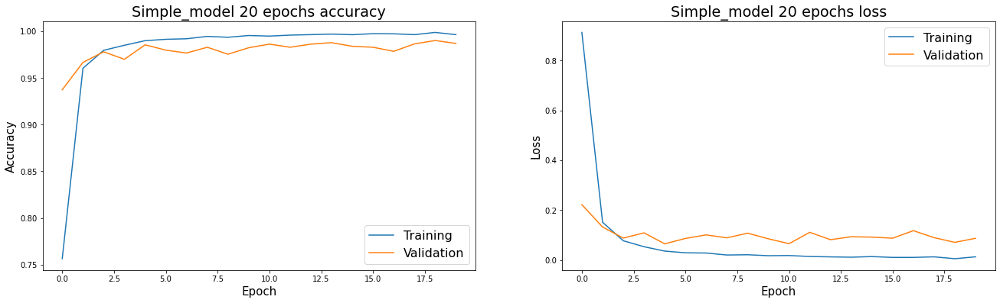

Predictions
405/405 [==============================] - 6s 2ms/step


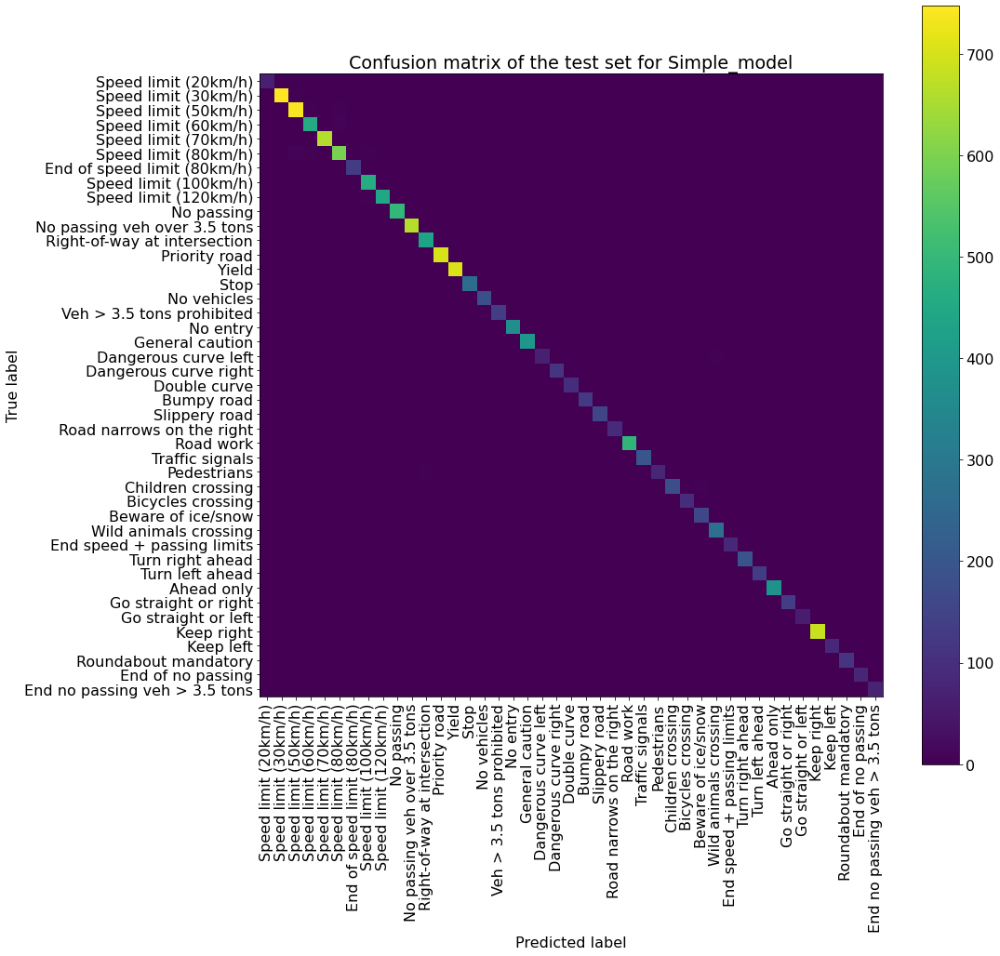

                               precision    recall  f1-score   support

         Speed limit (20km/h)       1.00      0.99      0.99        67
         Speed limit (30km/h)       0.99      0.99      0.99       757
         Speed limit (50km/h)       0.98      0.99      0.98       749
         Speed limit (60km/h)       0.98      0.98      0.98       470
         Speed limit (70km/h)       0.99      0.99      0.99       669
         Speed limit (80km/h)       0.96      0.97      0.97       617
  End of speed limit (80km/h)       0.99      0.99      0.99       133
        Speed limit (100km/h)       0.98      0.99      0.99       467
        Speed limit (120km/h)       0.99      0.99      0.99       453
                   No passing       1.00      0.99      0.99       498
 No passing veh over 3.5 tons       1.00      1.00      1.00       666
 Right-of-way at intersection       0.97      0.99      0.98       437
                Priority road       1.00      1.00      1.00       705
     

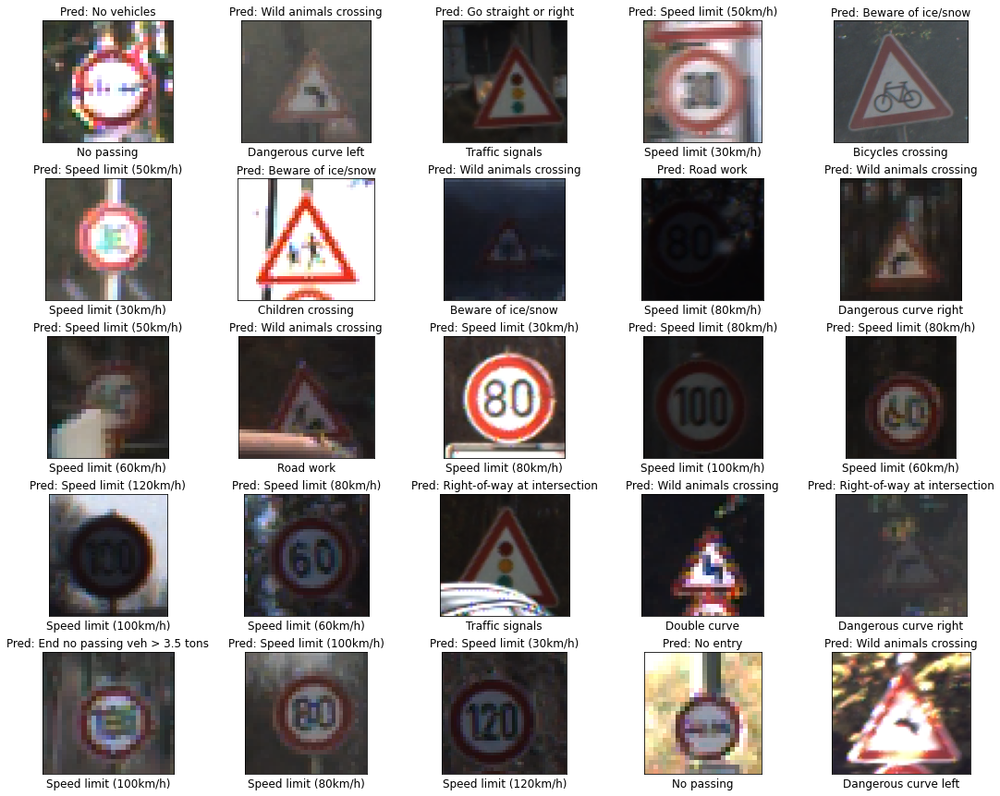

405/405 [==============================] - 1s 2ms/step - loss: 0.0623 - accuracy: 0.9888
CPU times: total: 3.11 s
Wall time: 8.93 s


In [18]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

#### Observations

- Even this model is the least involved of all models, it has a great accuracy of 98.9% for the test set!
- Really fast to compute (10 sec per epoch)

### ResNet50

#### Preprocessing

In [19]:
def preprocess_resnet(img_path):
    img = image.load_img(img_path, target_size=(width_im, height_im))
    x = image.img_to_array(img)
    x = resnet50.preprocess_input(x)
    return list(x)

In [20]:
%%time
train_images=np.array([preprocess_resnet(path) for path in list(train_paths)])
test_images=np.array([preprocess_resnet(path) for path in list(test_paths)])

CPU times: total: 3.94 s
Wall time: 28.2 s


#### With pretrained weights

In [21]:
%%time
n_model='With_ResNet50'
input_tensor = layers.Input(shape=(50, 50, 3))
base_model = ResNet50(input_tensor=input_tensor,weights='imagenet',include_top=False)
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)

predictions = layers.Dense(nb_classes, activation='softmax')(x)

model=keras.models.Model(inputs=base_model.input, outputs=predictions)

#Freeze the base model layers otherwise the weight will be updated
for layer in base_model.layers:
    layer.trainable = False

CPU times: total: 406 ms
Wall time: 1.53 s


Loading the model...


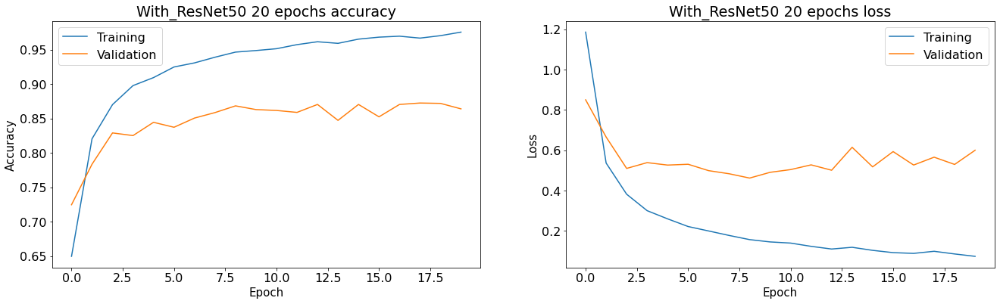

Predictions
405/405 [==============================] - 5s 11ms/step


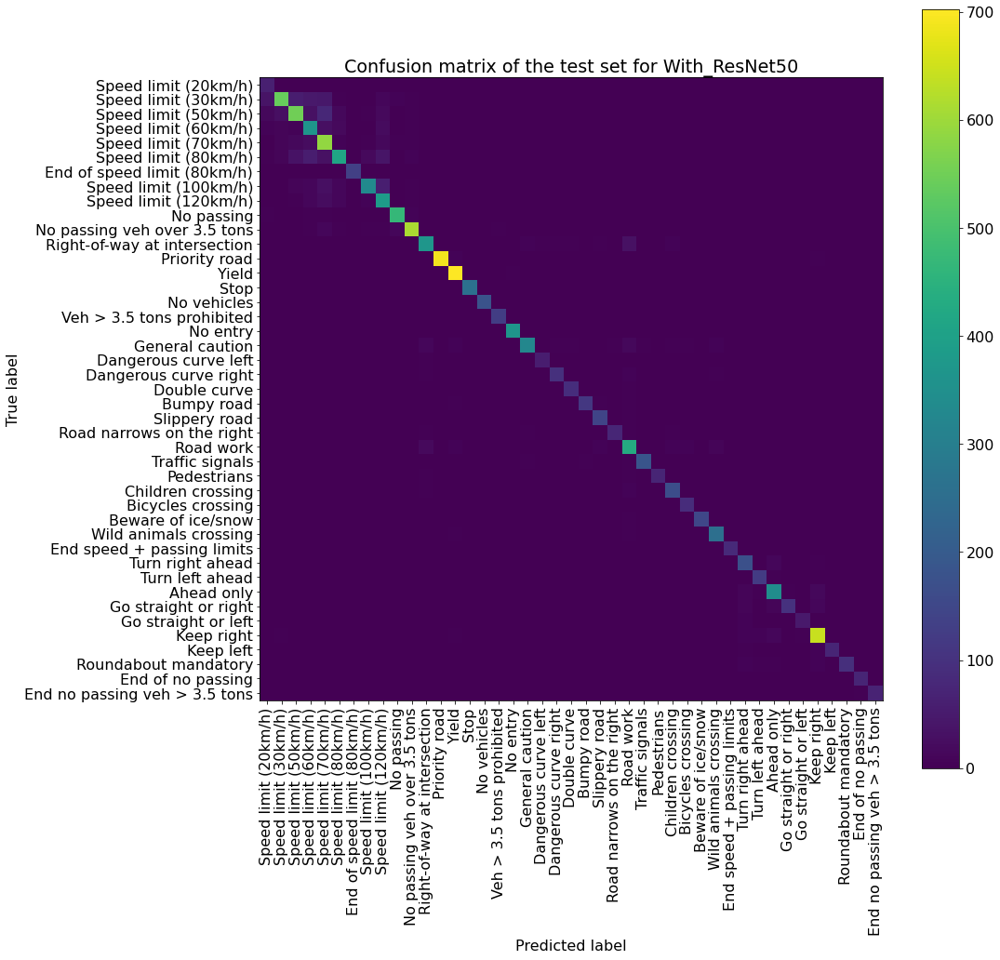

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.46      0.93      0.62        67
         Speed limit (30km/h)       0.88      0.71      0.79       757
         Speed limit (50km/h)       0.81      0.73      0.77       749
         Speed limit (60km/h)       0.65      0.78      0.71       470
         Speed limit (70km/h)       0.69      0.88      0.77       669
         Speed limit (80km/h)       0.85      0.67      0.75       617
  End of speed limit (80km/h)       0.99      0.99      0.99       133
        Speed limit (100km/h)       0.89      0.72      0.80       467
        Speed limit (120km/h)       0.69      0.85      0.76       453
                   No passing       0.93      0.94      0.93       498
 No passing veh over 3.5 tons       0.93      0.92      0.93       666
 Right-of-way at intersection       0.86      0.84      0.85       437
                Priority road       0.99      0.98      0.99       705
     

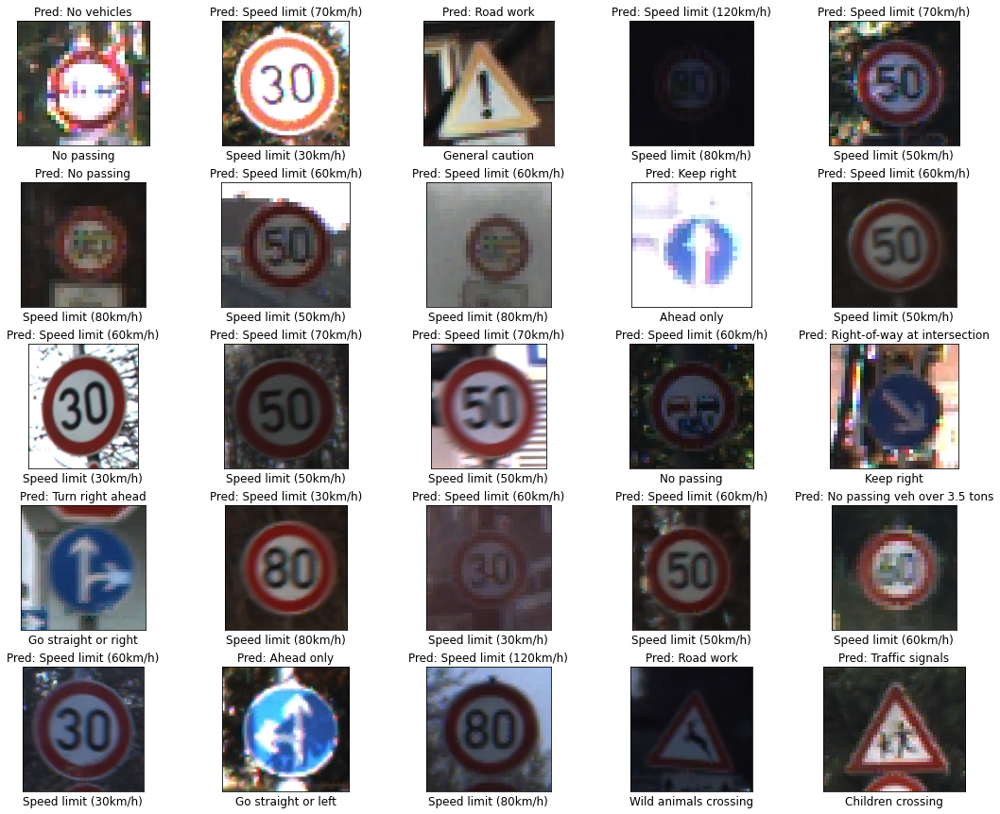

405/405 [==============================] - 6s 12ms/step - loss: 0.5989 - accuracy: 0.8659
CPU times: total: 5.38 s
Wall time: 14.4 s


In [22]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations : 

- This model is clearly overfitting the training set. 
- Big difficulty to predict correctly the speed limit signs 

#### Without pretrained weights

In [23]:
n_model='Without_ResNet50'
model = ResNet50(input_shape=(width_im,height_im,3),weights=None,classes=nb_classes)
print(model.summary())

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 50, 50, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 56, 56, 3)    0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 25, 25, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 25, 25, 64)   256         ['conv1_conv[0][0]']             
                                                                                           

                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 13, 13, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 13, 13, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_3_conv (Conv2D)   (None, 13, 13, 256)  16640       ['conv2_block3_2_relu[0][0]']    
                                                                                                  
 conv2_block3_3_bn (BatchNormal  (None, 13, 13, 256)  1024       ['conv2_block3_3_conv[0][0]']    
 ization) 

                                                                                                  
 conv3_block3_2_bn (BatchNormal  (None, 7, 7, 128)   512         ['conv3_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_2_relu (Activatio  (None, 7, 7, 128)   0           ['conv3_block3_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block3_3_conv (Conv2D)   (None, 7, 7, 512)    66048       ['conv3_block3_2_relu[0][0]']    
                                                                                                  
 conv3_block3_3_bn (BatchNormal  (None, 7, 7, 512)   2048        ['conv3_block3_3_conv[0][0]']    
 ization) 

                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 4, 4, 256)   1024        ['conv4_block2_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_2_relu (Activatio  (None, 4, 4, 256)   0           ['conv4_block2_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block2_3_conv (Conv2D)   (None, 4, 4, 1024)   263168      ['conv4_block2_2_relu[0][0]']    
                                                                                                  
 conv4_block2_3_bn (BatchNormal  (None, 4, 4, 1024)  4096        ['conv4_block2_3_conv[0][0]']    
 ization) 

 n)                                                                                               
                                                                                                  
 conv4_block5_3_conv (Conv2D)   (None, 4, 4, 1024)   263168      ['conv4_block5_2_relu[0][0]']    
                                                                                                  
 conv4_block5_3_bn (BatchNormal  (None, 4, 4, 1024)  4096        ['conv4_block5_3_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block5_add (Add)         (None, 4, 4, 1024)   0           ['conv4_block4_out[0][0]',       
                                                                  'conv4_block5_3_bn[0][0]']      
                                                                                                  
 conv4_blo

 n)                                                                                               
                                                                                                  
 conv5_block2_3_conv (Conv2D)   (None, 2, 2, 2048)   1050624     ['conv5_block2_2_relu[0][0]']    
                                                                                                  
 conv5_block2_3_bn (BatchNormal  (None, 2, 2, 2048)  8192        ['conv5_block2_3_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block2_add (Add)         (None, 2, 2, 2048)   0           ['conv5_block1_out[0][0]',       
                                                                  'conv5_block2_3_bn[0][0]']      
                                                                                                  
 conv5_blo

Loading the model...


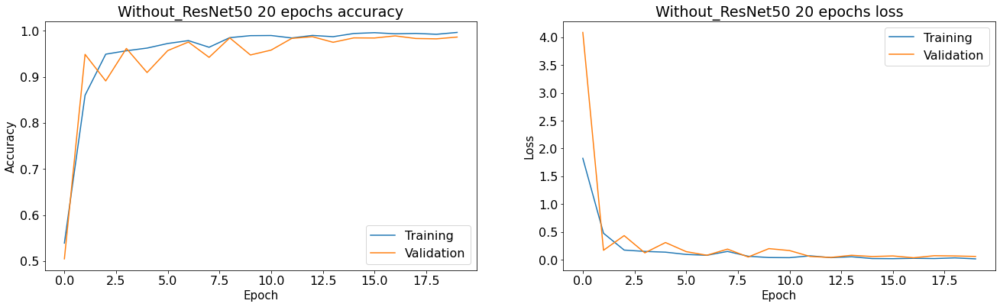

Predictions
405/405 [==============================] - 5s 12ms/step


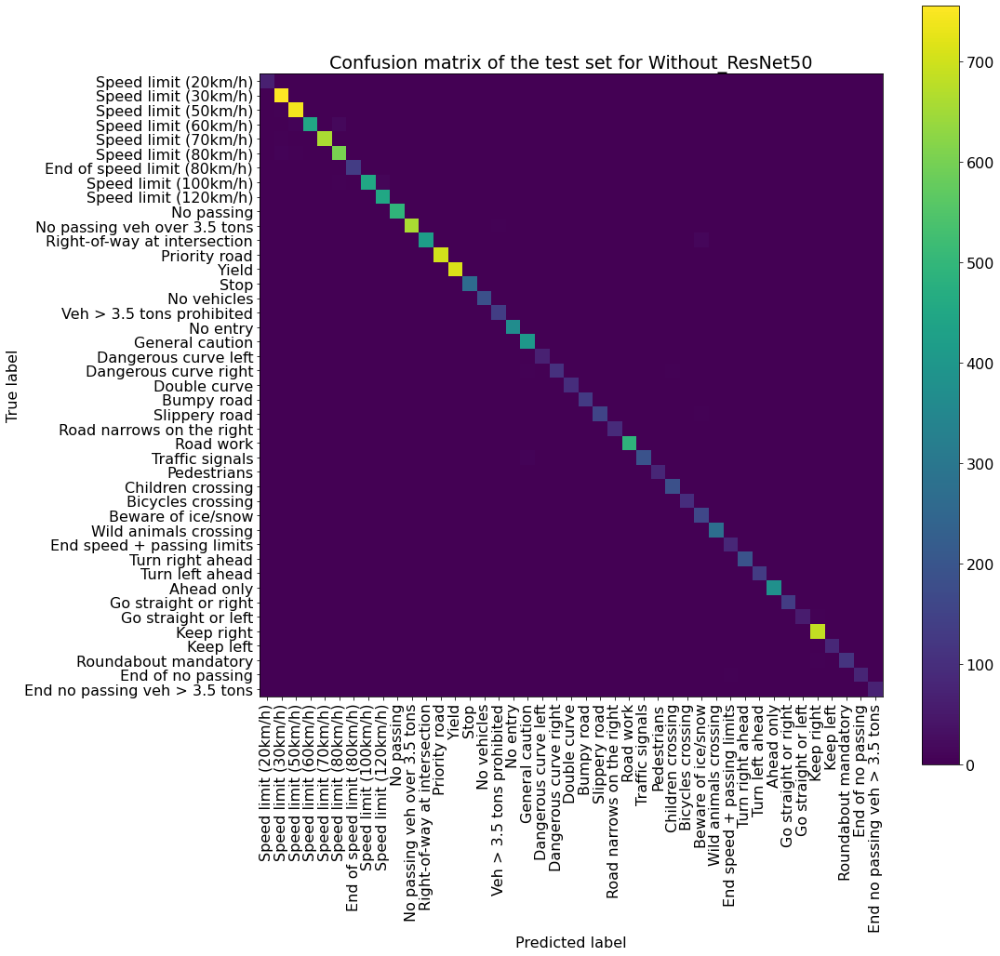

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.98      0.97      0.98        67
         Speed limit (30km/h)       0.98      1.00      0.99       757
         Speed limit (50km/h)       0.98      0.99      0.99       749
         Speed limit (60km/h)       1.00      0.95      0.97       470
         Speed limit (70km/h)       1.00      0.99      0.99       669
         Speed limit (80km/h)       0.96      0.98      0.97       617
  End of speed limit (80km/h)       0.98      1.00      0.99       133
        Speed limit (100km/h)       1.00      0.96      0.98       467
        Speed limit (120km/h)       0.97      0.99      0.98       453
                   No passing       1.00      0.99      1.00       498
 No passing veh over 3.5 tons       0.99      0.99      0.99       666
 Right-of-way at intersection       0.99      0.96      0.97       437
                Priority road       1.00      1.00      1.00       705
     

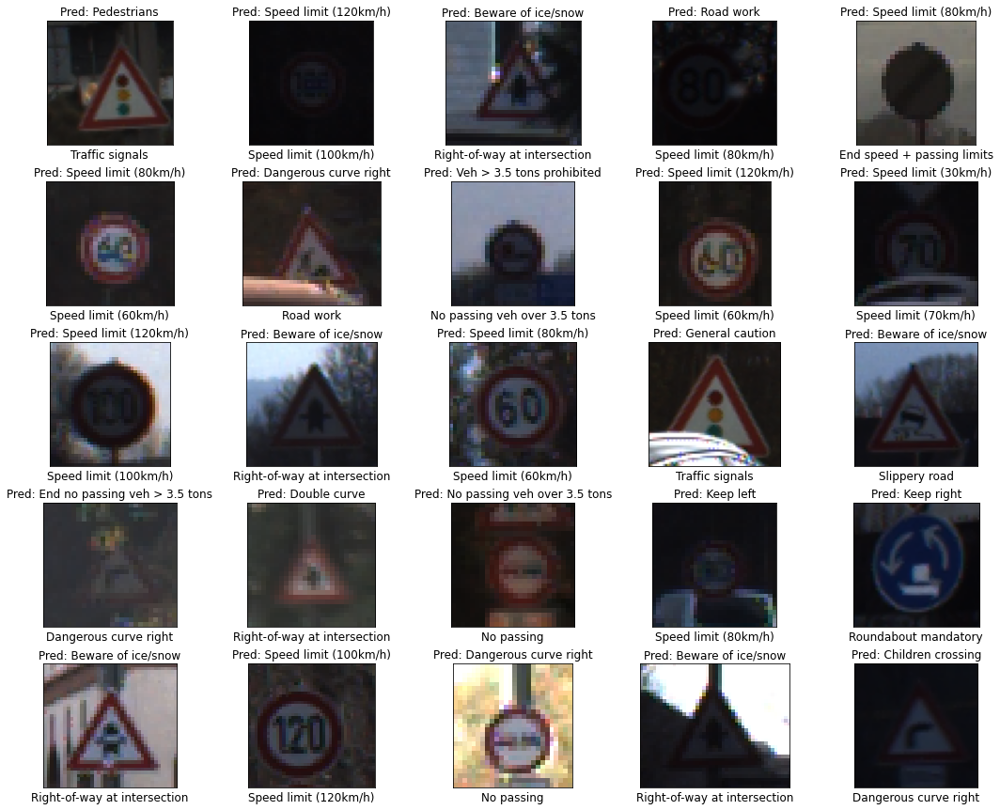

405/405 [==============================] - 5s 12ms/step - loss: 0.0521 - accuracy: 0.9864
CPU times: total: 5.5 s
Wall time: 15.2 s


In [24]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations :
- Validation scores instable during the 10 first epochs then stable
- No sign of overfitting
- Great test set accuracy (0.986)


### VGG16

#### Preprocessing

In [25]:
def preprocess_vgg16(img_path):
    img = image.load_img(img_path, target_size=(width_im, height_im))
    x = image.img_to_array(img)
    x = vgg16.preprocess_input(x)
    return list(x)

In [26]:
%%time
train_images=np.array([preprocess_vgg16(path) for path in list(train_paths)])
test_images=np.array([preprocess_vgg16(path) for path in list(test_paths)])

CPU times: total: 4.3 s
Wall time: 28 s


#### With pretrained weights

In [27]:
n_model='With_VGG16'
input_tensor = layers.Input(shape=(50, 50, 3))
base_model = VGG16(input_tensor=input_tensor,weights='imagenet',include_top=False)
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)

predictions = layers.Dense(nb_classes, activation='softmax')(x)

model=keras.models.Model(inputs=base_model.input, outputs=predictions)

#Freeze the base model layers otherwise the weight will be updated
for layer in base_model.layers:
    layer.trainable = False

Loading the model...


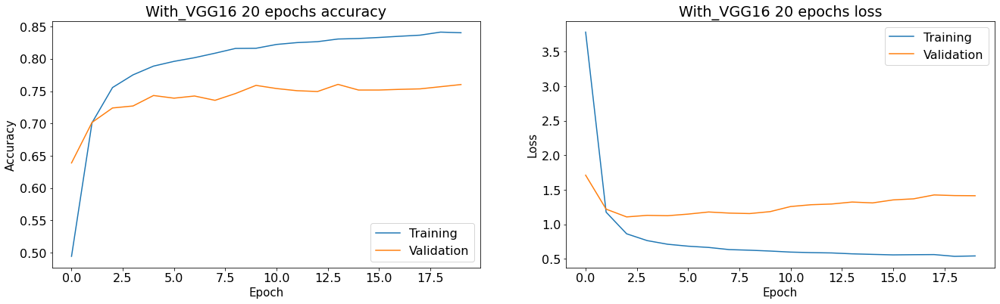

Predictions
405/405 [==============================] - 6s 14ms/step


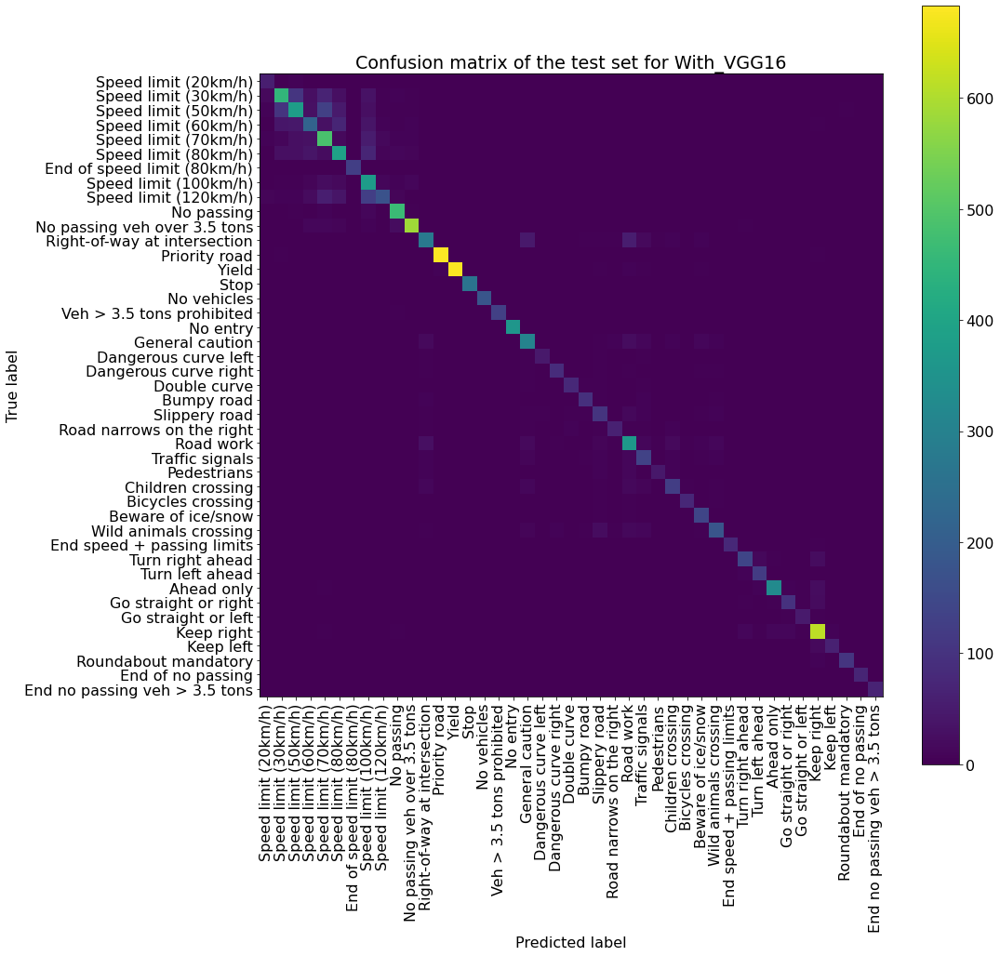

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.56      0.87      0.68        67
         Speed limit (30km/h)       0.68      0.59      0.64       757
         Speed limit (50km/h)       0.62      0.51      0.56       749
         Speed limit (60km/h)       0.55      0.46      0.51       470
         Speed limit (70km/h)       0.57      0.73      0.64       669
         Speed limit (80km/h)       0.63      0.64      0.63       617
  End of speed limit (80km/h)       0.97      0.95      0.96       133
        Speed limit (100km/h)       0.50      0.80      0.61       467
        Speed limit (120km/h)       0.76      0.38      0.51       453
                   No passing       0.83      0.93      0.88       498
 No passing veh over 3.5 tons       0.91      0.88      0.89       666
 Right-of-way at intersection       0.72      0.63      0.67       437
                Priority road       0.97      0.97      0.97       705
     

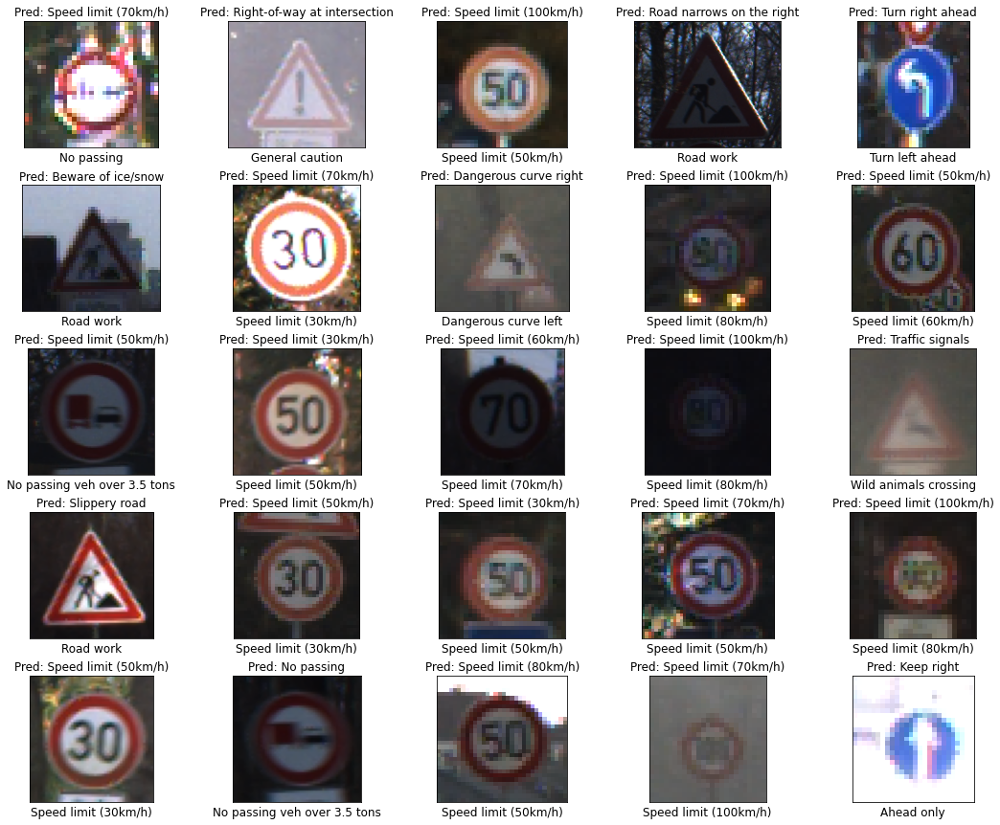

405/405 [==============================] - 6s 14ms/step - loss: 1.3089 - accuracy: 0.7608
CPU times: total: 3.33 s
Wall time: 14.7 s


In [28]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations : 

- This model is clearly overfitting the training set. 
- Big difficulty to predict correctly the speed limit signs 
- The test set accuracy is okay (0.76) 

#### Without pretrained weights

In [29]:
n_model='Without_VGG16'
model = VGG16(input_shape=(width_im,height_im,3),weights=None,classes=nb_classes)
print(model.summary())

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 50, 50, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 50, 50, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 50, 50, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 25, 25, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 25, 25, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 25, 25, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 12, 12, 128)       0     

Loading the model...


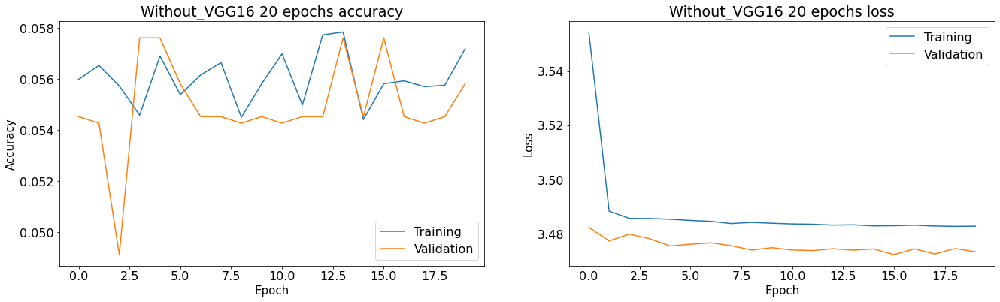

Predictions
405/405 [==============================] - 6s 14ms/step


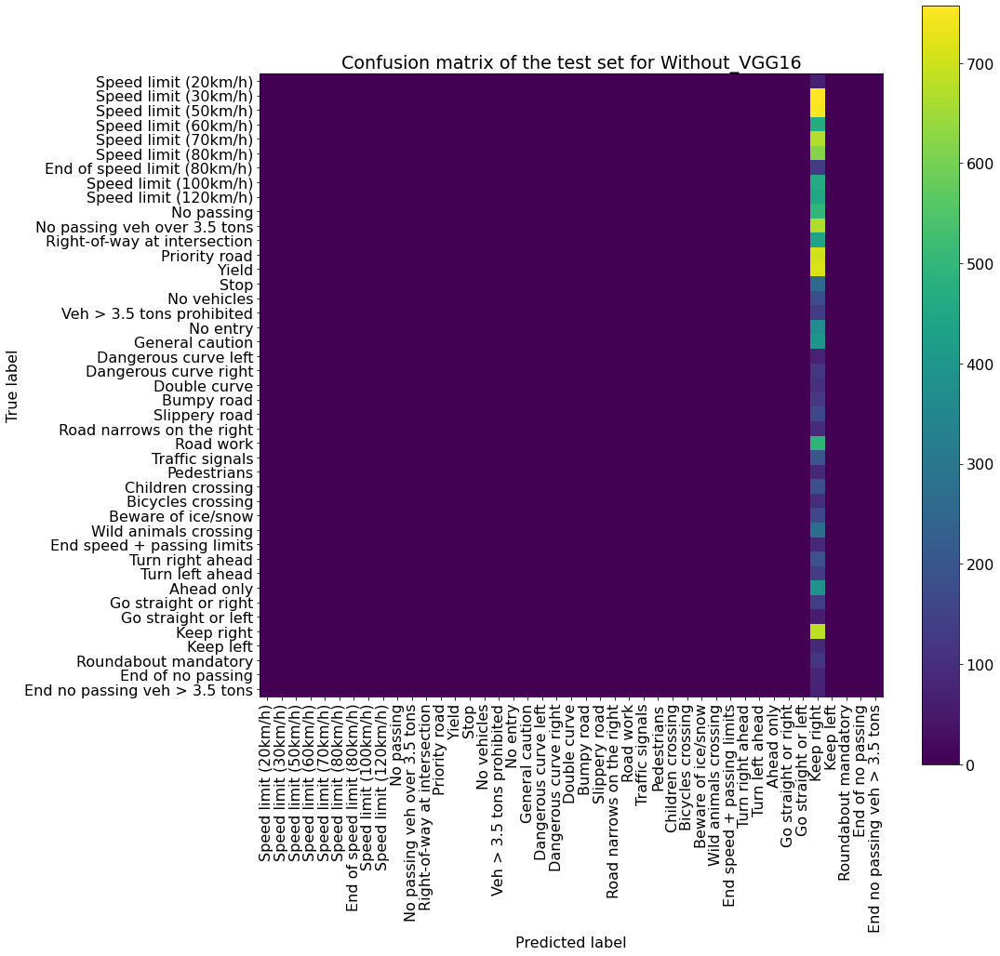

C:\Users\anton\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\anton\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\anton\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.00      0.00      0.00        67
         Speed limit (30km/h)       0.00      0.00      0.00       757
         Speed limit (50km/h)       0.00      0.00      0.00       749
         Speed limit (60km/h)       0.00      0.00      0.00       470
         Speed limit (70km/h)       0.00      0.00      0.00       669
         Speed limit (80km/h)       0.00      0.00      0.00       617
  End of speed limit (80km/h)       0.00      0.00      0.00       133
        Speed limit (100km/h)       0.00      0.00      0.00       467
        Speed limit (120km/h)       0.00      0.00      0.00       453
                   No passing       0.00      0.00      0.00       498
 No passing veh over 3.5 tons       0.00      0.00      0.00       666
 Right-of-way at intersection       0.00      0.00      0.00       437
                Priority road       0.00      0.00      0.00       705
     

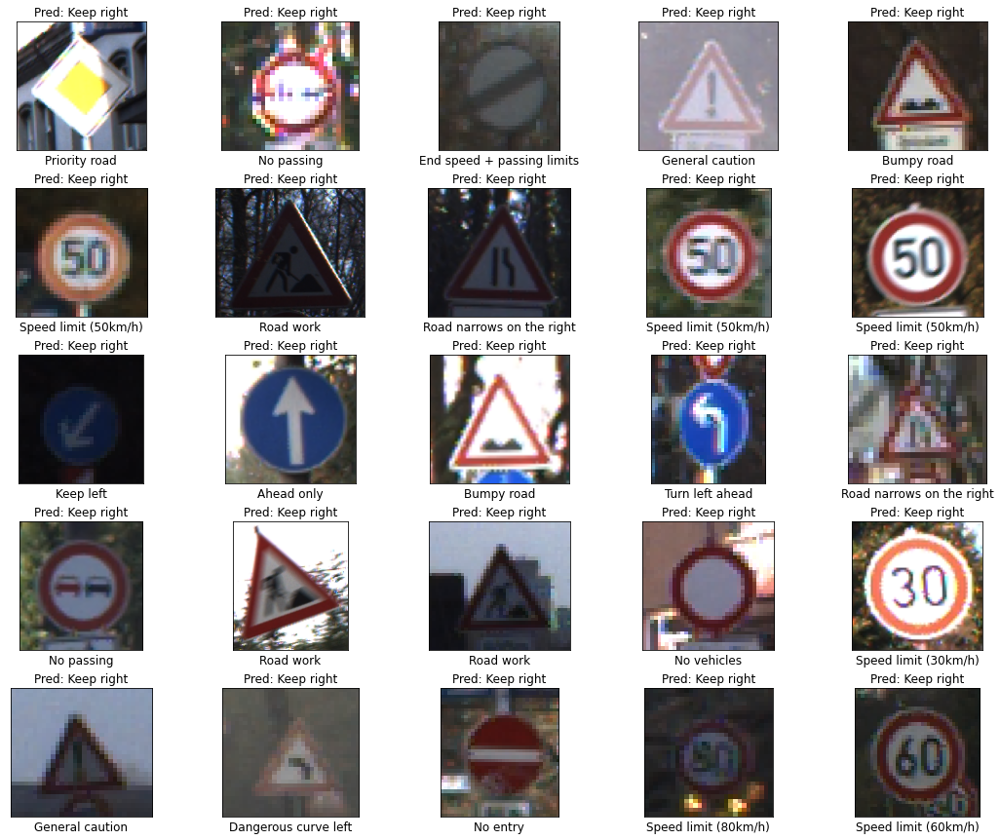

405/405 [==============================] - 6s 15ms/step - loss: 3.4829 - accuracy: 0.0529
CPU times: total: 1.92 s
Wall time: 15 s


In [30]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations :
- Predict always the same class
- TERRIBLE test set accuracy (0.05!!!!) Nothing to add.


### MobileNetV2

#### Preprocessing

In [31]:
def preprocess_mobilenet_v2(img_path):
    img = image.load_img(img_path, target_size=(width_im, height_im))
    x = image.img_to_array(img)
    x = mobilenet_v2.preprocess_input(x)
    return list(x)

In [32]:
%%time
train_images=np.array([preprocess_mobilenet_v2(path) for path in list(train_paths)])
test_images=np.array([preprocess_mobilenet_v2(path) for path in list(test_paths)])

CPU times: total: 3.66 s
Wall time: 26.8 s


#### With pretrained weights

In [33]:
n_model='With_MobileNetV2'
input_tensor = layers.Input(shape=(50, 50, 3))
base_model = MobileNetV2(input_tensor=input_tensor,weights='imagenet',include_top=False)
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)

predictions = layers.Dense(nb_classes, activation='softmax')(x)

model=keras.models.Model(inputs=base_model.input, outputs=predictions)

#Freeze the base model layers otherwise the weight will be updated
for layer in base_model.layers:
    layer.trainable = False

Loading the model...


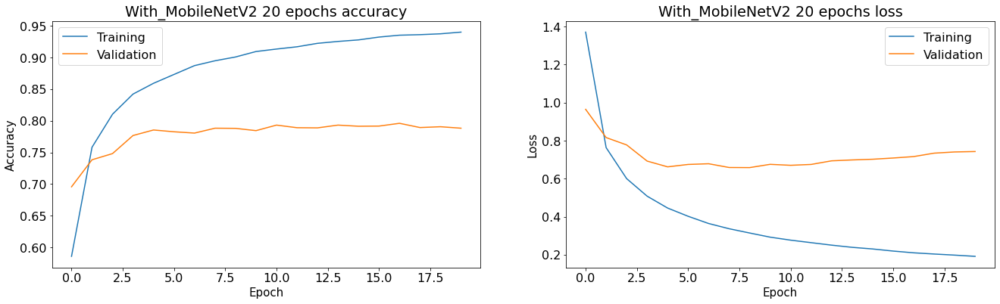

Predictions
405/405 [==============================] - 2s 4ms/step


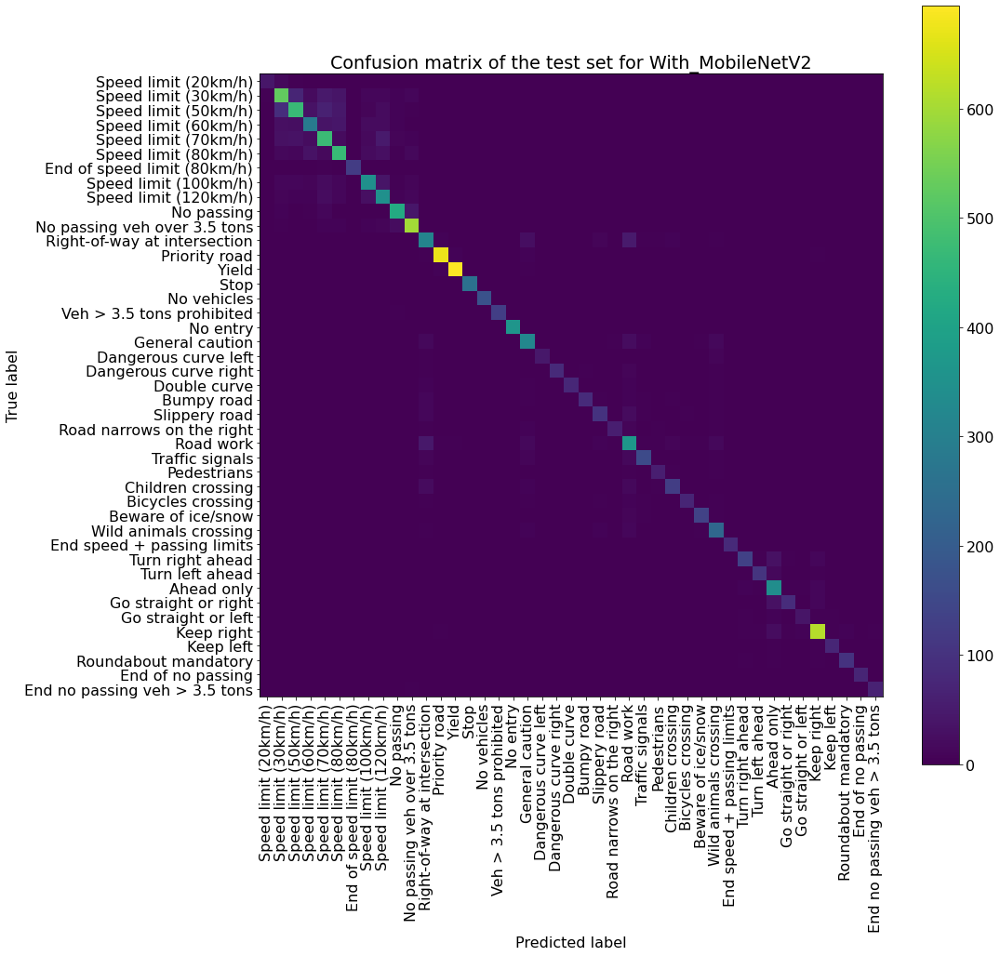

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.88      0.64      0.74        67
         Speed limit (30km/h)       0.71      0.70      0.70       757
         Speed limit (50km/h)       0.73      0.63      0.67       749
         Speed limit (60km/h)       0.67      0.60      0.64       470
         Speed limit (70km/h)       0.66      0.71      0.68       669
         Speed limit (80km/h)       0.72      0.76      0.74       617
  End of speed limit (80km/h)       0.98      0.92      0.95       133
        Speed limit (100km/h)       0.74      0.75      0.74       467
        Speed limit (120km/h)       0.66      0.77      0.71       453
                   No passing       0.85      0.85      0.85       498
 No passing veh over 3.5 tons       0.85      0.90      0.87       666
 Right-of-way at intersection       0.67      0.72      0.69       437
                Priority road       0.94      0.95      0.95       705
     

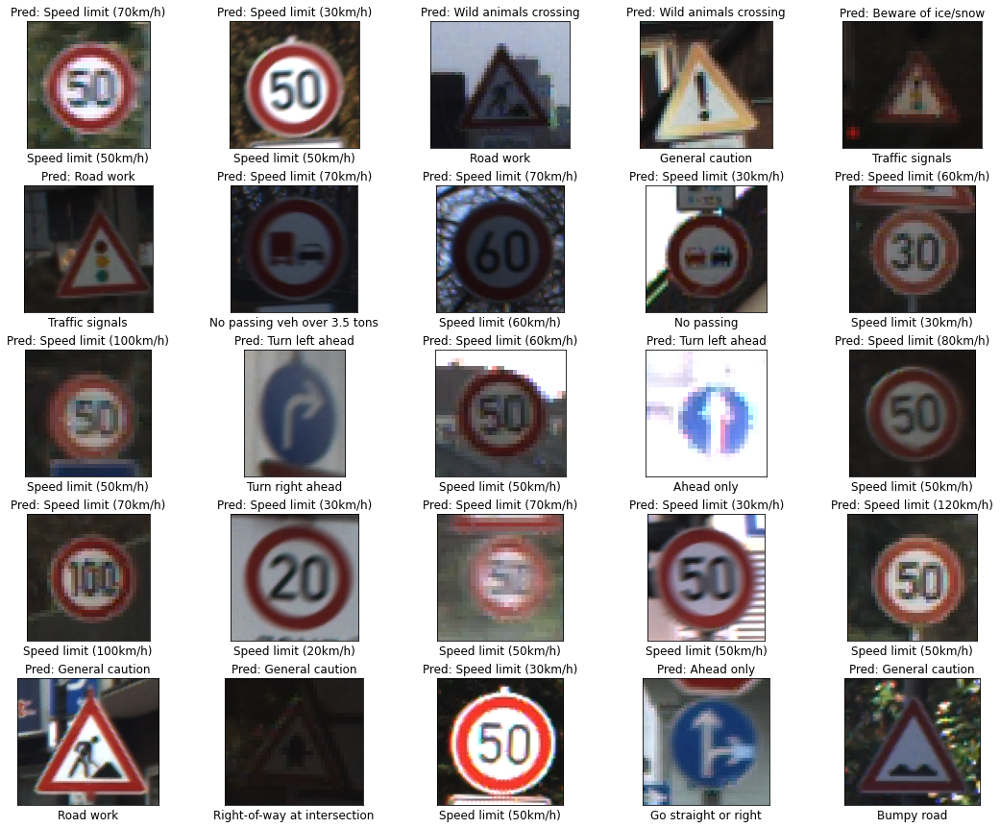

405/405 [==============================] - 2s 4ms/step - loss: 0.7027 - accuracy: 0.7987
CPU times: total: 3.7 s
Wall time: 7.62 s


In [34]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations : 

- This model is clearly overfitting the training set. 
- Big difficulty to predict correctly the speed limit signs
- Good test set accuracy (0.80)


#### Without pretrained weights

In [35]:
n_model='Without_MobileNetV2'
model = MobileNetV2(input_shape=(width_im,height_im,3),weights=None,classes=nb_classes)
print(model.summary())

Model: "mobilenetv2_1.00_50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 50, 50, 3)]  0           []                               
                                                                                                  
 Conv1 (Conv2D)                 (None, 25, 25, 32)   864         ['input_6[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 25, 25, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 25, 25, 32)   0           ['bn_Conv1[0][0]']               
                                                                                

                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 7, 7, 144)   576         ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_depthwise_relu (ReLU)  (None, 7, 7, 144)    0           ['block_3_depthwise_BN[0][0]']   
                                                                                                  
 block_3_project (Conv2D)       (None, 7, 7, 32)     4608        ['block_3_depthwise_relu[0][0]'] 
                                                                                                  
 block_3_project_BN (BatchNorma  (None, 7, 7, 32)    128         ['block_3_project[0][0]']        
 lization)                                                                                        
          

                                                                                                  
 block_7_expand_relu (ReLU)     (None, 4, 4, 384)    0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 4, 4, 384)   3456        ['block_7_expand_relu[0][0]']    
 nv2D)                                                                                            
                                                                                                  
 block_7_depthwise_BN (BatchNor  (None, 4, 4, 384)   1536        ['block_7_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_7_depthwise_relu (ReLU)  (None, 4, 4, 384)    0           ['block_7_depthwise_BN[0][0]']   
          

 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 4, 4, 576)    55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_expand_BN (BatchNorma  (None, 4, 4, 576)   2304        ['block_11_expand[0][0]']        
 lization)                                                                                        
                                                                                                  
 block_11_expand_relu (ReLU)    (None, 4, 4, 576)    0           ['block_11_expand_BN[0][0]']     
                                                                                                  
 block_11_depthwise (DepthwiseC  (None, 4, 4, 576)   5184        ['block_11_expand_relu[0][0]']   
 onv2D)   

 block_14_depthwise_relu (ReLU)  (None, 2, 2, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 2, 2, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_project_BN (BatchNorm  (None, 2, 2, 160)   640         ['block_14_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_14_add (Add)             (None, 2, 2, 160)    0           ['block_13_project_BN[0][0]',    
                                                                  'block_14_project_BN[0][0]']    
                                                                                                  
 block_15_

Loading the model...


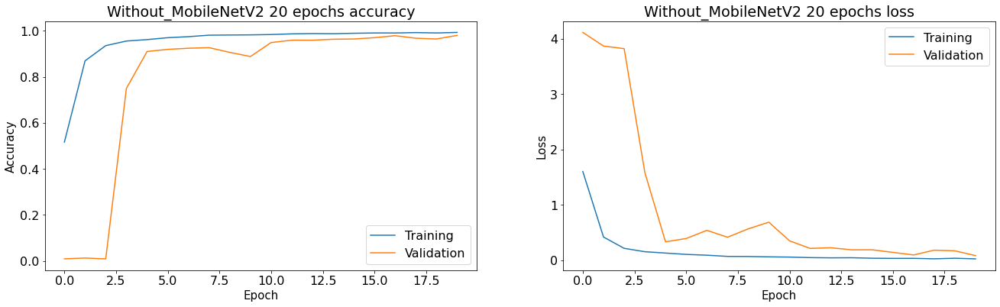

Predictions
405/405 [==============================] - 2s 5ms/step


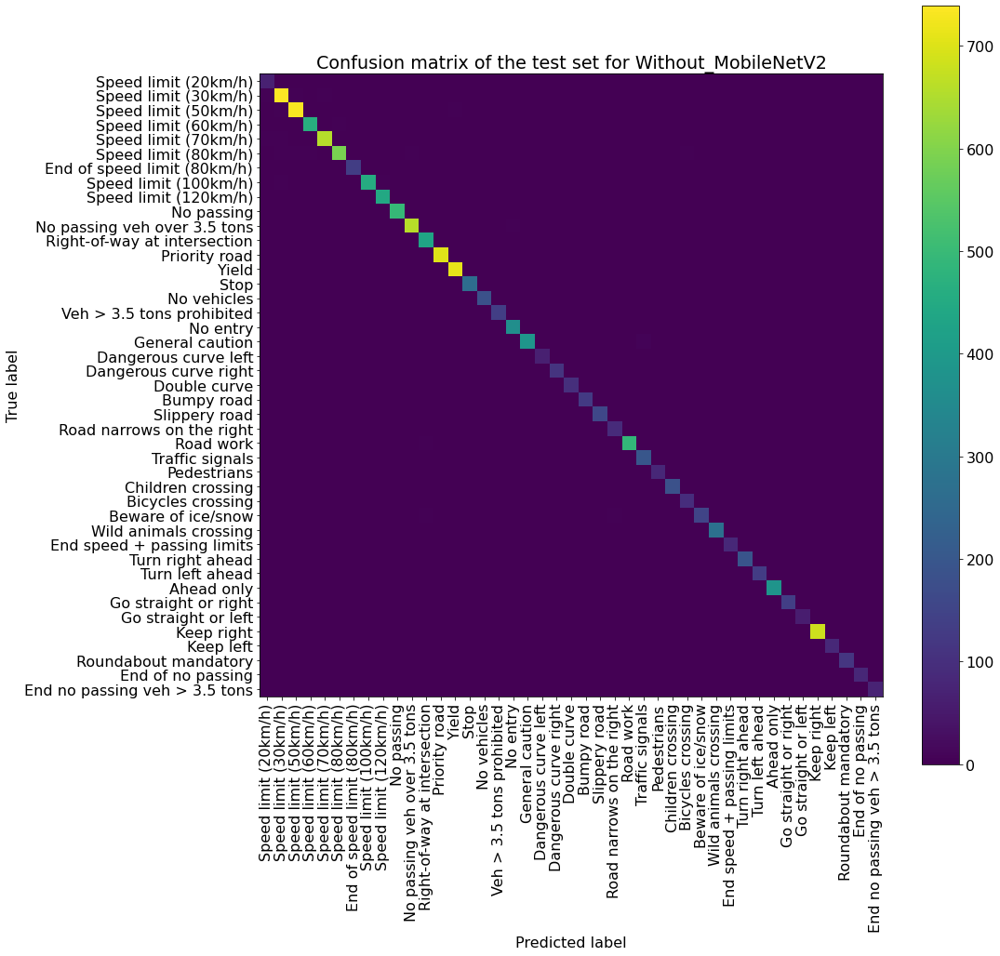

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.86      1.00      0.92        67
         Speed limit (30km/h)       0.98      0.98      0.98       757
         Speed limit (50km/h)       0.99      0.98      0.98       749
         Speed limit (60km/h)       0.98      0.98      0.98       470
         Speed limit (70km/h)       0.99      0.98      0.99       669
         Speed limit (80km/h)       0.98      0.96      0.97       617
  End of speed limit (80km/h)       0.97      1.00      0.99       133
        Speed limit (100km/h)       0.98      0.98      0.98       467
        Speed limit (120km/h)       0.99      0.98      0.99       453
                   No passing       0.99      0.99      0.99       498
 No passing veh over 3.5 tons       1.00      0.99      0.99       666
 Right-of-way at intersection       0.98      0.99      0.98       437
                Priority road       1.00      1.00      1.00       705
     

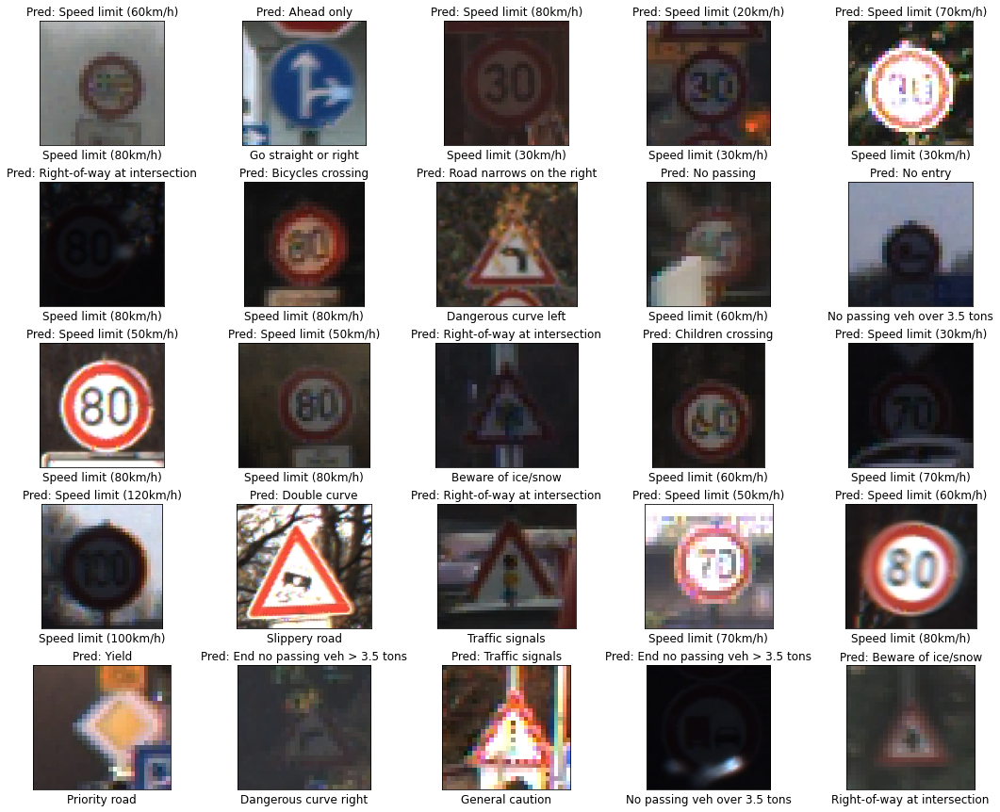

405/405 [==============================] - 3s 5ms/step - loss: 0.0558 - accuracy: 0.9859
CPU times: total: 4.08 s
Wall time: 8.64 s


In [36]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations :
- Validation scores instable during the 10 first epochs then stable
- No sign of overfitting
- Great test set accuracy (0.986)


### Densenet121

#### Preprocessing

In [37]:
def preprocess_densenet(img_path):
    img = image.load_img(img_path, target_size=(width_im, height_im))
    x = image.img_to_array(img)
    x = densenet.preprocess_input(x) #
    return list(x)

In [38]:
%%time
train_images=np.array([preprocess_densenet(path) for path in list(train_paths)])
test_images=np.array([preprocess_densenet(path) for path in list(test_paths)])

CPU times: total: 12.8 s
Wall time: 20.2 s


#### With pretrained weights

In [39]:
n_model='With_Densenet121'
input_tensor = layers.Input(shape=(50, 50, 3))
base_model = DenseNet121(input_tensor=input_tensor,weights='imagenet',include_top=False)
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)

predictions = layers.Dense(nb_classes, activation='softmax')(x)

model=keras.models.Model(inputs=base_model.input, outputs=predictions)

#Freeze the base model layers otherwise the weight will be updated
for layer in base_model.layers:
    layer.trainable = False

Loading the model...


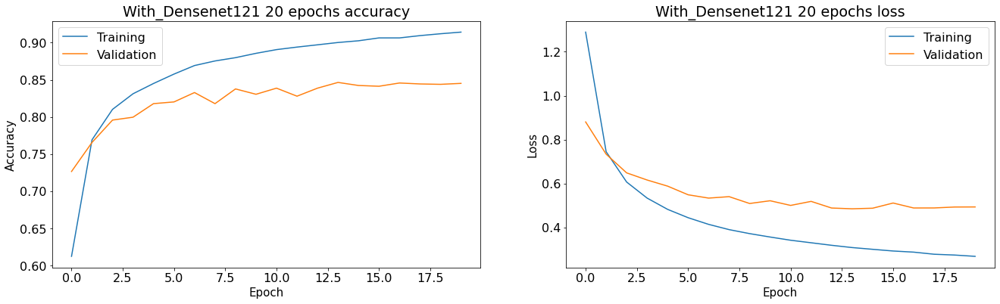

Predictions
405/405 [==============================] - 10s 16ms/step


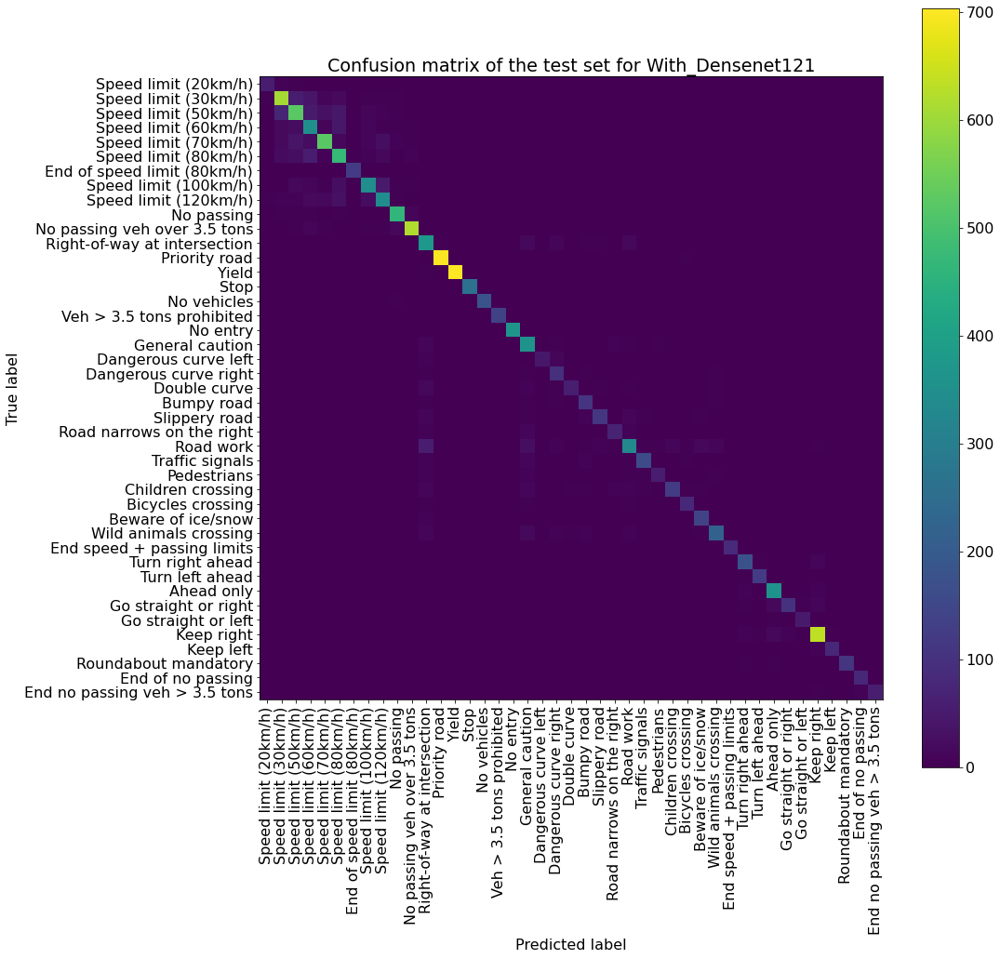

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.80      0.82      0.81        67
         Speed limit (30km/h)       0.80      0.80      0.80       757
         Speed limit (50km/h)       0.75      0.70      0.72       749
         Speed limit (60km/h)       0.61      0.74      0.67       470
         Speed limit (70km/h)       0.85      0.78      0.81       669
         Speed limit (80km/h)       0.71      0.76      0.74       617
  End of speed limit (80km/h)       0.97      0.94      0.95       133
        Speed limit (100km/h)       0.83      0.74      0.78       467
        Speed limit (120km/h)       0.75      0.75      0.75       453
                   No passing       0.90      0.93      0.92       498
 No passing veh over 3.5 tons       0.94      0.93      0.93       666
 Right-of-way at intersection       0.69      0.86      0.77       437
                Priority road       0.98      0.99      0.99       705
     

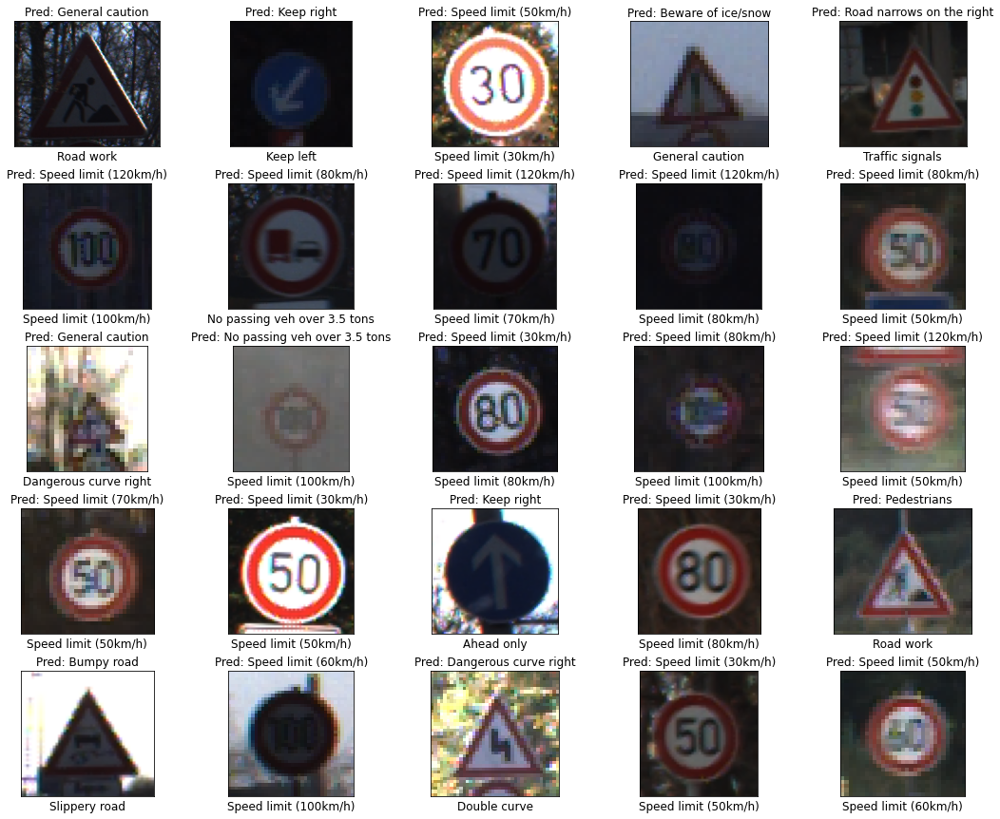

405/405 [==============================] - 10s 17ms/step - loss: 0.5054 - accuracy: 0.8451
CPU times: total: 10.7 s
Wall time: 25.3 s


In [40]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations : 

- This model is clearly overfitting the training set. 
- Big difficulty to predict correctly the speed limit signs
- Good test set accuracy (0.85)


#### Without pretrained weights

In [41]:
n_model='Without_Densenet121'
model = DenseNet121(input_shape=(width_im,height_im,3),weights=None,classes=nb_classes)
print(model.summary())

Model: "densenet121"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 50, 50, 3)]  0           []                               
                                                                                                  
 zero_padding2d_2 (ZeroPadding2  (None, 56, 56, 3)   0           ['input_8[0][0]']                
 D)                                                                                               
                                                                                                  
 conv1/conv (Conv2D)            (None, 25, 25, 64)   9408        ['zero_padding2d_2[0][0]']       
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 25, 25, 64)   256         ['conv1/conv[0][0]']   

                                                                                                  
 conv2_block4_1_bn (BatchNormal  (None, 13, 13, 128)  512        ['conv2_block4_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block4_1_relu (Activatio  (None, 13, 13, 128)  0          ['conv2_block4_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block4_2_conv (Conv2D)   (None, 13, 13, 32)   36864       ['conv2_block4_1_relu[0][0]']    
                                                                                                  
 conv2_block4_concat (Concatena  (None, 13, 13, 192)  0          ['conv2_block3_concat[0][0]',    
 te)      

 conv3_block2_1_conv (Conv2D)   (None, 6, 6, 128)    20480       ['conv3_block2_0_relu[0][0]']    
                                                                                                  
 conv3_block2_1_bn (BatchNormal  (None, 6, 6, 128)   512         ['conv3_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_1_relu (Activatio  (None, 6, 6, 128)   0           ['conv3_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block2_2_conv (Conv2D)   (None, 6, 6, 32)     36864       ['conv3_block2_1_relu[0][0]']    
                                                                                                  
 conv3_blo

                                                                                                  
 conv3_block6_2_conv (Conv2D)   (None, 6, 6, 32)     36864       ['conv3_block6_1_relu[0][0]']    
                                                                                                  
 conv3_block6_concat (Concatena  (None, 6, 6, 320)   0           ['conv3_block5_concat[0][0]',    
 te)                                                              'conv3_block6_2_conv[0][0]']    
                                                                                                  
 conv3_block7_0_bn (BatchNormal  (None, 6, 6, 320)   1280        ['conv3_block6_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block7_0_relu (Activatio  (None, 6, 6, 320)   0           ['conv3_block7_0_bn[0][0]']      
 n)       

 lization)                                                                                        
                                                                                                  
 conv3_block11_0_relu (Activati  (None, 6, 6, 448)   0           ['conv3_block11_0_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv3_block11_1_conv (Conv2D)  (None, 6, 6, 128)    57344       ['conv3_block11_0_relu[0][0]']   
                                                                                                  
 conv3_block11_1_bn (BatchNorma  (None, 6, 6, 128)   512         ['conv3_block11_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv3_blo

 conv4_block3_0_bn (BatchNormal  (None, 3, 3, 320)   1280        ['conv4_block2_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block3_0_relu (Activatio  (None, 3, 3, 320)   0           ['conv4_block3_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block3_1_conv (Conv2D)   (None, 3, 3, 128)    40960       ['conv4_block3_0_relu[0][0]']    
                                                                                                  
 conv4_block3_1_bn (BatchNormal  (None, 3, 3, 128)   512         ['conv4_block3_1_conv[0][0]']    
 ization)                                                                                         
          

                                                                                                  
 conv4_block7_1_bn (BatchNormal  (None, 3, 3, 128)   512         ['conv4_block7_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block7_1_relu (Activatio  (None, 3, 3, 128)   0           ['conv4_block7_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block7_2_conv (Conv2D)   (None, 3, 3, 32)     36864       ['conv4_block7_1_relu[0][0]']    
                                                                                                  
 conv4_block7_concat (Concatena  (None, 3, 3, 480)   0           ['conv4_block6_concat[0][0]',    
 te)      

 conv4_block11_2_conv (Conv2D)  (None, 3, 3, 32)     36864       ['conv4_block11_1_relu[0][0]']   
                                                                                                  
 conv4_block11_concat (Concaten  (None, 3, 3, 608)   0           ['conv4_block10_concat[0][0]',   
 ate)                                                             'conv4_block11_2_conv[0][0]']   
                                                                                                  
 conv4_block12_0_bn (BatchNorma  (None, 3, 3, 608)   2432        ['conv4_block11_concat[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block12_0_relu (Activati  (None, 3, 3, 608)   0           ['conv4_block12_0_bn[0][0]']     
 on)                                                                                              
          

                                                                                                  
 conv4_block16_0_relu (Activati  (None, 3, 3, 736)   0           ['conv4_block16_0_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block16_1_conv (Conv2D)  (None, 3, 3, 128)    94208       ['conv4_block16_0_relu[0][0]']   
                                                                                                  
 conv4_block16_1_bn (BatchNorma  (None, 3, 3, 128)   512         ['conv4_block16_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block16_1_relu (Activati  (None, 3, 3, 128)   0           ['conv4_block16_1_bn[0][0]']     
 on)      

 lization)                                                                                        
                                                                                                  
 conv4_block20_1_relu (Activati  (None, 3, 3, 128)   0           ['conv4_block20_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block20_2_conv (Conv2D)  (None, 3, 3, 32)     36864       ['conv4_block20_1_relu[0][0]']   
                                                                                                  
 conv4_block20_concat (Concaten  (None, 3, 3, 896)   0           ['conv4_block19_concat[0][0]',   
 ate)                                                             'conv4_block20_2_conv[0][0]']   
                                                                                                  
 conv4_blo

 conv4_block24_concat (Concaten  (None, 3, 3, 1024)  0           ['conv4_block23_concat[0][0]',   
 ate)                                                             'conv4_block24_2_conv[0][0]']   
                                                                                                  
 pool4_bn (BatchNormalization)  (None, 3, 3, 1024)   4096        ['conv4_block24_concat[0][0]']   
                                                                                                  
 pool4_relu (Activation)        (None, 3, 3, 1024)   0           ['pool4_bn[0][0]']               
                                                                                                  
 pool4_conv (Conv2D)            (None, 3, 3, 512)    524288      ['pool4_relu[0][0]']             
                                                                                                  
 pool4_pool (AveragePooling2D)  (None, 1, 1, 512)    0           ['pool4_conv[0][0]']             
          

                                                                                                  
 conv5_block4_concat (Concatena  (None, 1, 1, 640)   0           ['conv5_block3_concat[0][0]',    
 te)                                                              'conv5_block4_2_conv[0][0]']    
                                                                                                  
 conv5_block5_0_bn (BatchNormal  (None, 1, 1, 640)   2560        ['conv5_block4_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block5_0_relu (Activatio  (None, 1, 1, 640)   0           ['conv5_block5_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_blo

 conv5_block9_0_relu (Activatio  (None, 1, 1, 768)   0           ['conv5_block9_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_block9_1_conv (Conv2D)   (None, 1, 1, 128)    98304       ['conv5_block9_0_relu[0][0]']    
                                                                                                  
 conv5_block9_1_bn (BatchNormal  (None, 1, 1, 128)   512         ['conv5_block9_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block9_1_relu (Activatio  (None, 1, 1, 128)   0           ['conv5_block9_1_bn[0][0]']      
 n)                                                                                               
          

                                                                                                  
 conv5_block13_1_relu (Activati  (None, 1, 1, 128)   0           ['conv5_block13_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv5_block13_2_conv (Conv2D)  (None, 1, 1, 32)     36864       ['conv5_block13_1_relu[0][0]']   
                                                                                                  
 conv5_block13_concat (Concaten  (None, 1, 1, 928)   0           ['conv5_block12_concat[0][0]',   
 ate)                                                             'conv5_block13_2_conv[0][0]']   
                                                                                                  
 conv5_block14_0_bn (BatchNorma  (None, 1, 1, 928)   3712        ['conv5_block13_concat[0][0]']   
 lization)

Loading the model...


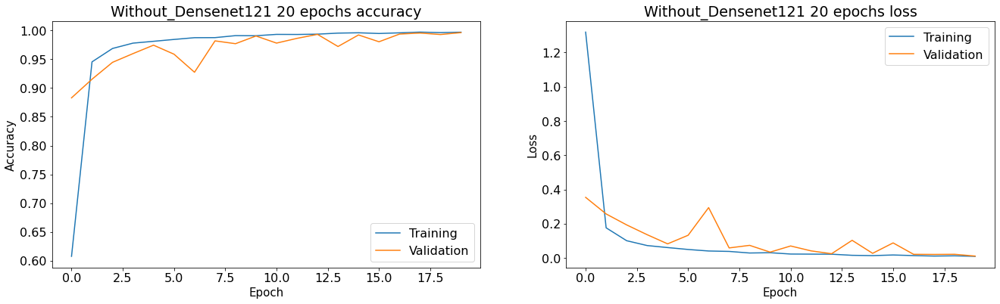

Predictions
405/405 [==============================] - 10s 16ms/step


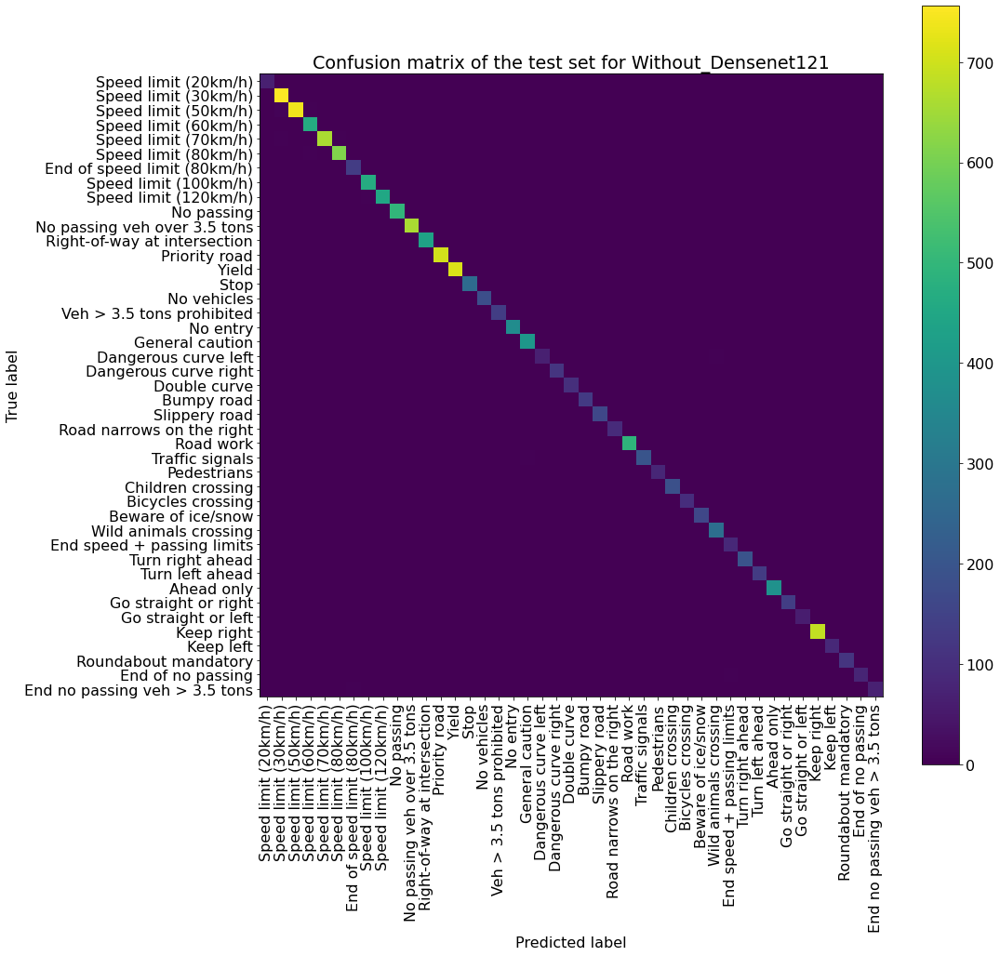

                               precision    recall  f1-score   support

         Speed limit (20km/h)       1.00      1.00      1.00        67
         Speed limit (30km/h)       0.99      1.00      0.99       757
         Speed limit (50km/h)       1.00      0.99      0.99       749
         Speed limit (60km/h)       0.98      0.99      0.99       470
         Speed limit (70km/h)       1.00      0.99      0.99       669
         Speed limit (80km/h)       0.99      0.99      0.99       617
  End of speed limit (80km/h)       0.98      1.00      0.99       133
        Speed limit (100km/h)       0.99      1.00      1.00       467
        Speed limit (120km/h)       1.00      0.99      1.00       453
                   No passing       1.00      1.00      1.00       498
 No passing veh over 3.5 tons       1.00      0.99      0.99       666
 Right-of-way at intersection       0.99      1.00      0.99       437
                Priority road       1.00      1.00      1.00       705
     

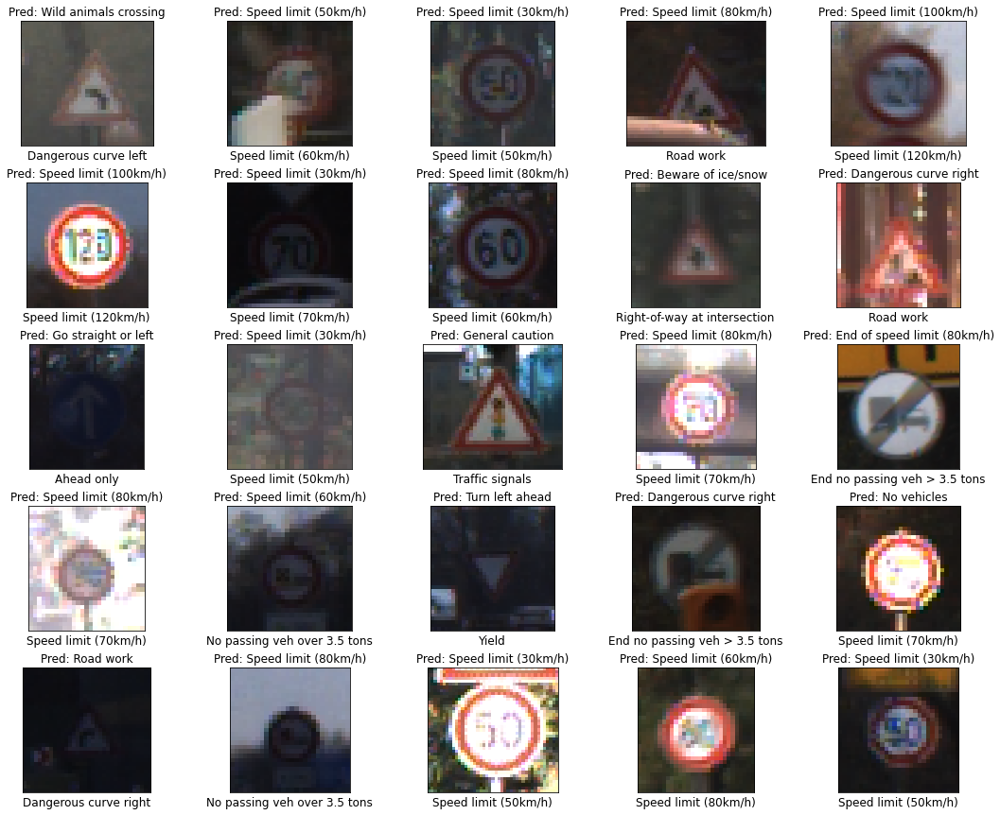

405/405 [==============================] - 10s 17ms/step - loss: 0.0192 - accuracy: 0.9944
CPU times: total: 10.8 s
Wall time: 26.1 s


In [42]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations :
- Validation score instable during the 10 first epochs then stable
- No sign of overfitting
- Great test set accuracy (0.986)


### NASNetMobile

#### Preprocessing

In [43]:
def preprocess_nasnet(img_path):
    img = image.load_img(img_path, target_size=(width_im, height_im))
    x = image.img_to_array(img)
    x = nasnet.preprocess_input(x)
    return list(x)

In [44]:
%%time
train_images=np.array([preprocess_nasnet(path) for path in list(train_paths)])
test_images=np.array([preprocess_nasnet(path) for path in list(test_paths)])

CPU times: total: 7.66 s
Wall time: 24.3 s


#### With pretrained weights

In [45]:
n_model='With_NASNetMobile'
input_tensor = layers.Input(shape=(50, 50, 3))
base_model = NASNetMobile(input_tensor=input_tensor,weights='imagenet',include_top=False)
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)

predictions = layers.Dense(nb_classes, activation='softmax')(x)

model=keras.models.Model(inputs=base_model.input, outputs=predictions)

#Freeze the base model layers otherwise the weight will be updated
for layer in base_model.layers:
    layer.trainable = False

Loading the model...


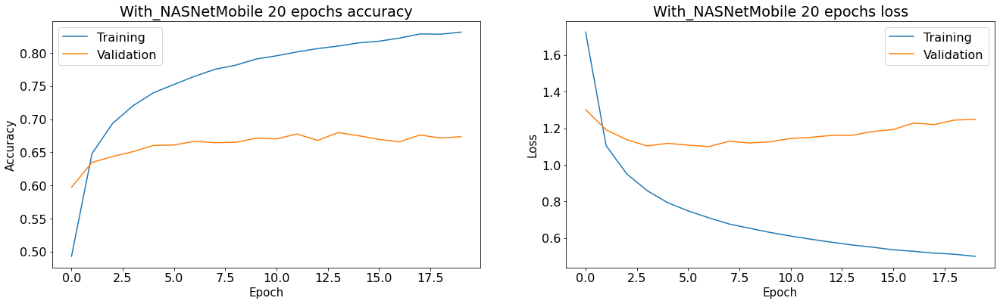

Predictions
405/405 [==============================] - 11s 16ms/step


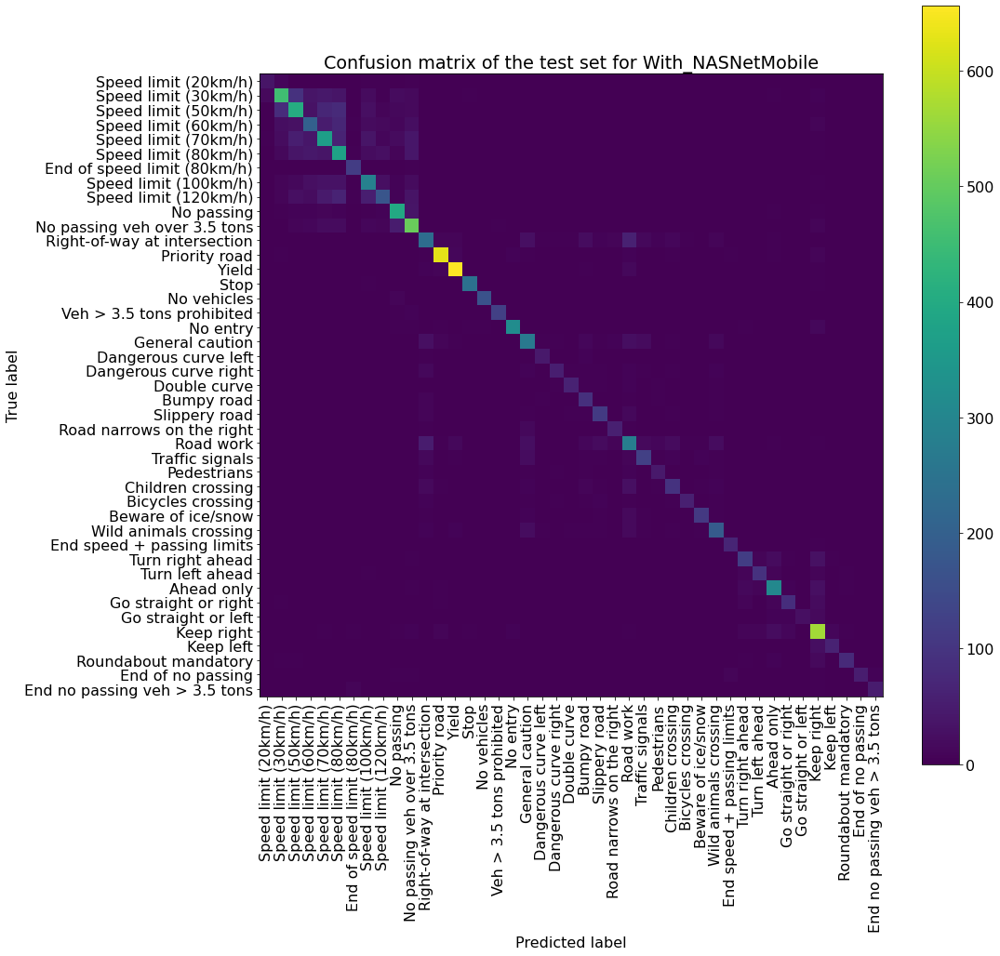

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.57      0.55      0.56        67
         Speed limit (30km/h)       0.70      0.60      0.64       757
         Speed limit (50km/h)       0.59      0.54      0.57       749
         Speed limit (60km/h)       0.47      0.43      0.45       470
         Speed limit (70km/h)       0.53      0.55      0.54       669
         Speed limit (80km/h)       0.50      0.61      0.55       617
  End of speed limit (80km/h)       0.78      0.87      0.82       133
        Speed limit (100km/h)       0.58      0.62      0.60       467
        Speed limit (120km/h)       0.59      0.38      0.47       453
                   No passing       0.69      0.79      0.74       498
 No passing veh over 3.5 tons       0.65      0.76      0.70       666
 Right-of-way at intersection       0.55      0.53      0.54       437
                Priority road       0.91      0.89      0.90       705
     

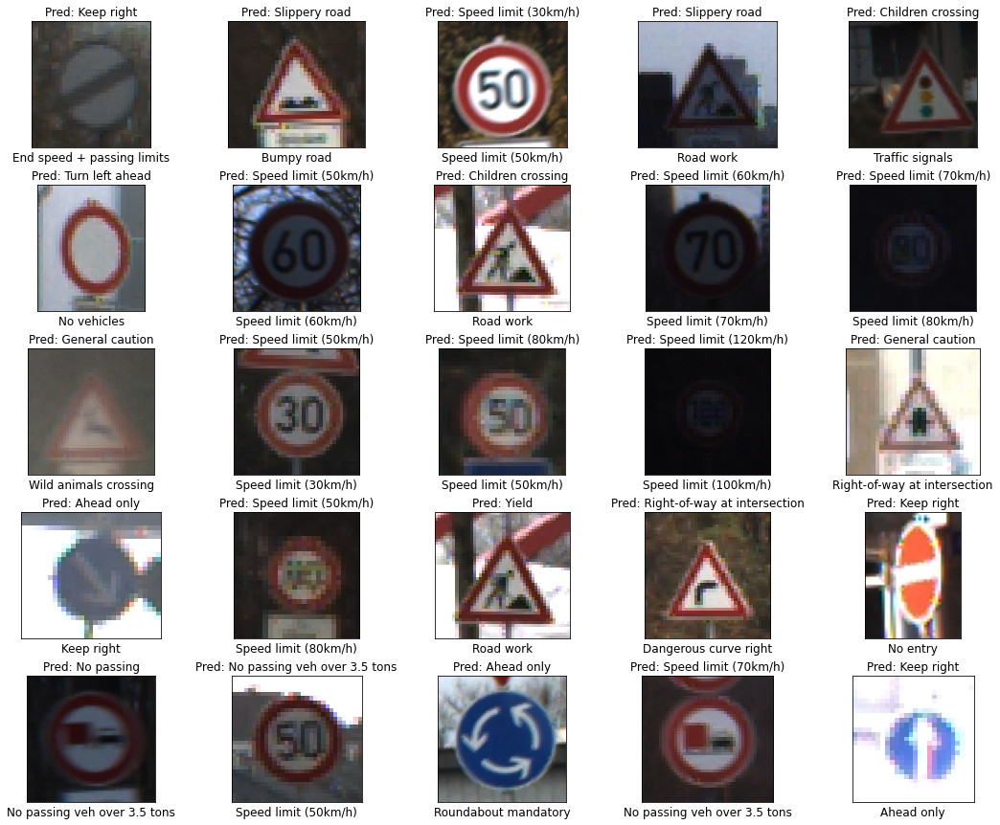

405/405 [==============================] - 12s 16ms/step - loss: 1.2277 - accuracy: 0.6784
CPU times: total: 15.9 s
Wall time: 29.8 s


In [46]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations : 

- This model is clearly overfitting the training set. 
- Big difficulty to predict correctly the speed limit signs
- Test set accuracy okay (0.68)


#### Without pretrained weights

In [47]:
n_model='Without_NASNetMobile'
model = NASNetMobile(input_shape=(width_im,height_im,3),weights=None,classes=nb_classes)
print(model.summary())

Model: "NASNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, 50, 50, 3)]  0           []                               
                                                                                                  
 stem_conv1 (Conv2D)            (None, 24, 24, 32)   864         ['input_10[0][0]']               
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 24, 24, 32)   128         ['stem_conv1[0][0]']             
                                                                                                  
 activation_188 (Activation)    (None, 24, 24, 32)   0           ['stem_bn1[0][0]']               
                                                                                             

 ion)                                                                                             
                                                                                                  
 separable_conv_1_reduction_rig  (None, 12, 12, 11)  1152        ['separable_conv_1_pad_reduction_
 ht3_stem_1 (SeparableConv2D)                                    right3_stem_1[0][0]']            
                                                                                                  
 separable_conv_1_reduction_lef  (None, 12, 12, 11)  220         ['activation_197[0][0]']         
 t4_stem_1 (SeparableConv2D)                                                                      
                                                                                                  
 activation_194 (Activation)    (None, 12, 12, 11)   0           ['separable_conv_1_bn_reduction_r
                                                                 ight2_stem_1[0][0]']             
          

                                                                                                  
 reduction_concat_stem_1 (Conca  (None, 12, 12, 44)  0           ['reduction_add_2_stem_1[0][0]', 
 tenate)                                                          'reduction_add3_stem_1[0][0]',  
                                                                  'add_4[0][0]',                  
                                                                  'reduction_add4_stem_1[0][0]']  
                                                                                                  
 adjust_avg_pool_1_stem_2 (Aver  (None, 12, 12, 32)  0           ['adjust_relu_1_stem_2[0][0]']   
 agePooling2D)                                                                                    
                                                                                                  
 adjust_avg_pool_2_stem_2 (Aver  (None, 12, 12, 32)  0           ['cropping2d_4[0][0]']           
 agePoolin

 reduction_add_1_stem_2 (Add)   (None, 6, 6, 22)     0           ['separable_conv_2_bn_reduction_l
                                                                 eft1_stem_2[0][0]',              
                                                                  'separable_conv_2_bn_reduction_r
                                                                 ight1_stem_2[0][0]']             
                                                                                                  
 separable_conv_1_reduction_rig  (None, 6, 6, 22)    1562        ['separable_conv_1_pad_reduction_
 ht2_stem_2 (SeparableConv2D)                                    right2_stem_2[0][0]']            
                                                                                                  
 separable_conv_1_pad_reduction  (None, 15, 15, 22)  0           ['activation_206[0][0]']         
 _right3_stem_2 (ZeroPadding2D)                                                                   
          

 D)                                                                                               
                                                                                                  
 reduction_add3_stem_2 (Add)    (None, 6, 6, 22)     0           ['reduction_left3_stem_2[0][0]', 
                                                                  'separable_conv_2_bn_reduction_r
                                                                 ight3_stem_2[0][0]']             
                                                                                                  
 add_5 (Add)                    (None, 6, 6, 22)     0           ['reduction_add_2_stem_2[0][0]', 
                                                                  'reduction_left4_stem_2[0][0]'] 
                                                                                                  
 reduction_add4_stem_2 (Add)    (None, 6, 6, 22)     0           ['separable_conv_2_bn_reduction_l
          

 activation_212 (Activation)    (None, 6, 6, 44)     0           ['separable_conv_1_bn_normal_left
                                                                 1_0[0][0]']                      
                                                                                                  
 activation_214 (Activation)    (None, 6, 6, 44)     0           ['separable_conv_1_bn_normal_righ
                                                                 t1_0[0][0]']                     
                                                                                                  
 activation_216 (Activation)    (None, 6, 6, 44)     0           ['separable_conv_1_bn_normal_left
                                                                 2_0[0][0]']                      
                                                                                                  
 activation_218 (Activation)    (None, 6, 6, 44)     0           ['separable_conv_1_bn_normal_righ
          

 activation_222 (Activation)    (None, 6, 6, 264)    0           ['normal_concat_0[0][0]']        
                                                                                                  
 adjust_conv_projection_1 (Conv  (None, 6, 6, 44)    3872        ['activation_221[0][0]']         
 2D)                                                                                              
                                                                                                  
 normal_conv_1_1 (Conv2D)       (None, 6, 6, 44)     11616       ['activation_222[0][0]']         
                                                                                                  
 adjust_bn_1 (BatchNormalizatio  (None, 6, 6, 44)    176         ['adjust_conv_projection_1[0][0]'
 n)                                                              ]                                
                                                                                                  
 normal_bn

 separable_conv_2_bn_normal_lef  (None, 6, 6, 44)    176         ['separable_conv_2_normal_left1_1
 t1_1 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 6, 6, 44)    176         ['separable_conv_2_normal_right1_
 ht1_1 (BatchNormalization)                                      1[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 6, 6, 44)    176         ['separable_conv_2_normal_left2_1
 t2_1 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 6, 6, 44)    176         ['separable_conv_2_normal_right2_
 ht2_1 (Ba

 2 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right2  (None, 6, 6, 44)    2332        ['activation_241[0][0]']         
 _2 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left5_  (None, 6, 6, 44)    2332        ['activation_243[0][0]']         
 2 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 6, 6, 44)    176         ['separable_conv_1_normal_left1_2
 t1_2 (BatchNormalization)                                       [0][0]']                         
          

                                                                 2_2[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_2[0][0]']                     
                                                                                                  
 normal_add_3_2 (Add)           (None, 6, 6, 44)     0           ['normal_left3_2[0][0]',         
                                                                  'adjust_bn_2[0][0]']            
                                                                                                  
 normal_add_4_2 (Add)           (None, 6, 6, 44)     0           ['normal_left4_2[0][0]',         
                                                                  'normal_right4_2[0][0]']        
                                                                                                  
 normal_ad

                                                                 2_3[0][0]']                      
                                                                                                  
 activation_254 (Activation)    (None, 6, 6, 44)     0           ['separable_conv_1_bn_normal_righ
                                                                 t2_3[0][0]']                     
                                                                                                  
 activation_256 (Activation)    (None, 6, 6, 44)     0           ['separable_conv_1_bn_normal_left
                                                                 5_3[0][0]']                      
                                                                                                  
 separable_conv_2_normal_left1_  (None, 6, 6, 44)    3036        ['activation_248[0][0]']         
 3 (SeparableConv2D)                                                                              
          

                                                                                                  
 reduction_bn_1_reduce_4 (Batch  (None, 6, 6, 88)    352         ['reduction_conv_1_reduce_4[0][0]
 Normalization)                                                  ']                               
                                                                                                  
 adjust_bn_reduce_4 (BatchNorma  (None, 6, 6, 88)    352         ['adjust_conv_projection_reduce_4
 lization)                                                       [0][0]']                         
                                                                                                  
 activation_259 (Activation)    (None, 6, 6, 88)     0           ['reduction_bn_1_reduce_4[0][0]']
                                                                                                  
 activation_261 (Activation)    (None, 6, 6, 88)     0           ['adjust_bn_reduce_4[0][0]']     
          

 separable_conv_1_reduction_lef  (None, 3, 3, 88)    8536        ['activation_267[0][0]']         
 t4_reduce_4 (SeparableConv2D)                                                                    
                                                                                                  
 activation_264 (Activation)    (None, 3, 3, 88)     0           ['separable_conv_1_bn_reduction_r
                                                                 ight2_reduce_4[0][0]']           
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 3, 3, 88)    352         ['separable_conv_1_reduction_righ
 right3_reduce_4 (BatchNormaliz                                  t3_reduce_4[0][0]']              
 ation)                                                                                           
                                                                                                  
 separable

                                                                  'reduction_add4_reduce_4[0][0]']
                                                                                                  
 adjust_avg_pool_1_5 (AveragePo  (None, 3, 3, 264)   0           ['adjust_relu_1_5[0][0]']        
 oling2D)                                                                                         
                                                                                                  
 adjust_avg_pool_2_5 (AveragePo  (None, 3, 3, 264)   0           ['cropping2d_6[0][0]']           
 oling2D)                                                                                         
                                                                                                  
 adjust_conv_1_5 (Conv2D)       (None, 3, 3, 44)     11616       ['adjust_avg_pool_1_5[0][0]']    
                                                                                                  
 adjust_co

                                                                                                  
 separable_conv_2_normal_right1  (None, 3, 3, 88)    8536        ['activation_273[0][0]']         
 _5 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left2_  (None, 3, 3, 88)    9944        ['activation_275[0][0]']         
 5 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_normal_right2  (None, 3, 3, 88)    8536        ['activation_277[0][0]']         
 _5 (SeparableConv2D)                                                                             
                                                                                                  
 separable

                                                                                                  
 activation_286 (Activation)    (None, 3, 3, 88)     0           ['adjust_bn_6[0][0]']            
                                                                                                  
 activation_288 (Activation)    (None, 3, 3, 88)     0           ['adjust_bn_6[0][0]']            
                                                                                                  
 activation_290 (Activation)    (None, 3, 3, 88)     0           ['normal_bn_1_6[0][0]']          
                                                                                                  
 separable_conv_1_normal_left1_  (None, 3, 3, 88)    9944        ['activation_282[0][0]']         
 6 (SeparableConv2D)                                                                              
                                                                                                  
 separable

 2D)                                                                                              
                                                                                                  
 normal_right4_6 (AveragePoolin  (None, 3, 3, 88)    0           ['adjust_bn_6[0][0]']            
 g2D)                                                                                             
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 3, 3, 88)    352         ['separable_conv_2_normal_left5_6
 t5_6 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 normal_add_1_6 (Add)           (None, 3, 3, 88)     0           ['separable_conv_2_bn_normal_left
                                                                 1_6[0][0]',                      
          

                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 3, 3, 88)    352         ['separable_conv_1_normal_right2_
 ht2_7 (BatchNormalization)                                      7[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 3, 3, 88)    352         ['separable_conv_1_normal_left5_7
 t5_7 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 activation_295 (Activation)    (None, 3, 3, 88)     0           ['separable_conv_1_bn_normal_left
                                                                 1_7[0][0]']                      
                                                                                                  
 activatio

                                                                  'normal_add_2_7[0][0]',         
                                                                  'normal_add_3_7[0][0]',         
                                                                  'normal_add_4_7[0][0]',         
                                                                  'normal_add_5_7[0][0]']         
                                                                                                  
 activation_304 (Activation)    (None, 3, 3, 528)    0           ['normal_concat_6[0][0]']        
                                                                                                  
 activation_305 (Activation)    (None, 3, 3, 528)    0           ['normal_concat_7[0][0]']        
                                                                                                  
 adjust_conv_projection_8 (Conv  (None, 3, 3, 88)    46464       ['activation_304[0][0]']         
 2D)      

                                                                                                  
 separable_conv_2_normal_right2  (None, 3, 3, 88)    8536        ['activation_313[0][0]']         
 _8 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_left5_  (None, 3, 3, 88)    8536        ['activation_315[0][0]']         
 8 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 3, 3, 88)    352         ['separable_conv_2_normal_left1_8
 t1_8 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable

 _right1_reduce_8 (ZeroPadding2                                                                   
 D)                                                                                               
                                                                                                  
 separable_conv_1_reduction_lef  (None, 2, 2, 176)   35376       ['separable_conv_1_pad_reduction_
 t1_reduce_8 (SeparableConv2D)                                   left1_reduce_8[0][0]']           
                                                                                                  
 separable_conv_1_reduction_rig  (None, 2, 2, 176)   39600       ['separable_conv_1_pad_reduction_
 ht1_reduce_8 (SeparableConv2D)                                  right1_reduce_8[0][0]']          
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 2, 2, 176)   704         ['separable_conv_1_reduction_left
 left1_red

                                                                                                  
 separable_conv_2_reduction_rig  (None, 2, 2, 176)   39600       ['activation_323[0][0]']         
 ht2_reduce_8 (SeparableConv2D)                                                                   
                                                                                                  
 activation_325 (Activation)    (None, 2, 2, 176)    0           ['separable_conv_1_bn_reduction_r
                                                                 ight3_reduce_8[0][0]']           
                                                                                                  
 activation_327 (Activation)    (None, 2, 2, 176)    0           ['separable_conv_1_bn_reduction_l
                                                                 eft4_reduce_8[0][0]']            
                                                                                                  
 reduction

                                                                  'adjust_conv_2_9[0][0]']        
                                                                                                  
 normal_conv_1_9 (Conv2D)       (None, 2, 2, 176)    123904      ['activation_328[0][0]']         
                                                                                                  
 adjust_bn_9 (BatchNormalizatio  (None, 2, 2, 176)   704         ['concatenate_7[0][0]']          
 n)                                                                                               
                                                                                                  
 normal_bn_1_9 (BatchNormalizat  (None, 2, 2, 176)   704         ['normal_conv_1_9[0][0]']        
 ion)                                                                                             
                                                                                                  
 activatio

 separable_conv_2_bn_normal_rig  (None, 2, 2, 176)   704         ['separable_conv_2_normal_right1_
 ht1_9 (BatchNormalization)                                      9[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 2, 2, 176)   704         ['separable_conv_2_normal_left2_9
 t2_9 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 2, 2, 176)   704         ['separable_conv_2_normal_right2_
 ht2_9 (BatchNormalization)                                      9[0][0]']                        
                                                                                                  
 normal_left3_9 (AveragePooling  (None, 2, 2, 176)   0           ['normal_bn_1_9[0][0]']          
 2D)      

 separable_conv_1_normal_right2  (None, 2, 2, 176)   32560       ['activation_347[0][0]']         
 _10 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left5_  (None, 2, 2, 176)   32560       ['activation_349[0][0]']         
 10 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 2, 2, 176)   704         ['separable_conv_1_normal_left1_1
 t1_10 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 2, 2, 176)   704         ['separable_conv_1_normal_right1_
 ht1_10 (B

                                                                 t2_10[0][0]']                    
                                                                                                  
 normal_add_3_10 (Add)          (None, 2, 2, 176)    0           ['normal_left3_10[0][0]',        
                                                                  'adjust_bn_10[0][0]']           
                                                                                                  
 normal_add_4_10 (Add)          (None, 2, 2, 176)    0           ['normal_left4_10[0][0]',        
                                                                  'normal_right4_10[0][0]']       
                                                                                                  
 normal_add_5_10 (Add)          (None, 2, 2, 176)    0           ['separable_conv_2_bn_normal_left
                                                                 5_10[0][0]',                     
          

 activation_360 (Activation)    (None, 2, 2, 176)    0           ['separable_conv_1_bn_normal_righ
                                                                 t2_11[0][0]']                    
                                                                                                  
 activation_362 (Activation)    (None, 2, 2, 176)    0           ['separable_conv_1_bn_normal_left
                                                                 5_11[0][0]']                     
                                                                                                  
 separable_conv_2_normal_left1_  (None, 2, 2, 176)   35376       ['activation_354[0][0]']         
 11 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_right1  (None, 2, 2, 176)   32560       ['activation_356[0][0]']         
 _11 (Sepa

                                                                                                  
 normal_bn_1_12 (BatchNormaliza  (None, 2, 2, 176)   704         ['normal_conv_1_12[0][0]']       
 tion)                                                                                            
                                                                                                  
 activation_365 (Activation)    (None, 2, 2, 176)    0           ['normal_bn_1_12[0][0]']         
                                                                                                  
 activation_367 (Activation)    (None, 2, 2, 176)    0           ['adjust_bn_12[0][0]']           
                                                                                                  
 activation_369 (Activation)    (None, 2, 2, 176)    0           ['adjust_bn_12[0][0]']           
                                                                                                  
 activatio

 separable_conv_2_bn_normal_rig  (None, 2, 2, 176)   704         ['separable_conv_2_normal_right2_
 ht2_12 (BatchNormalization)                                     12[0][0]']                       
                                                                                                  
 normal_left3_12 (AveragePoolin  (None, 2, 2, 176)   0           ['normal_bn_1_12[0][0]']         
 g2D)                                                                                             
                                                                                                  
 normal_left4_12 (AveragePoolin  (None, 2, 2, 176)   0           ['adjust_bn_12[0][0]']           
 g2D)                                                                                             
                                                                                                  
 normal_right4_12 (AveragePooli  (None, 2, 2, 176)   0           ['adjust_bn_12[0][0]']           
 ng2D)    

Loading the model...


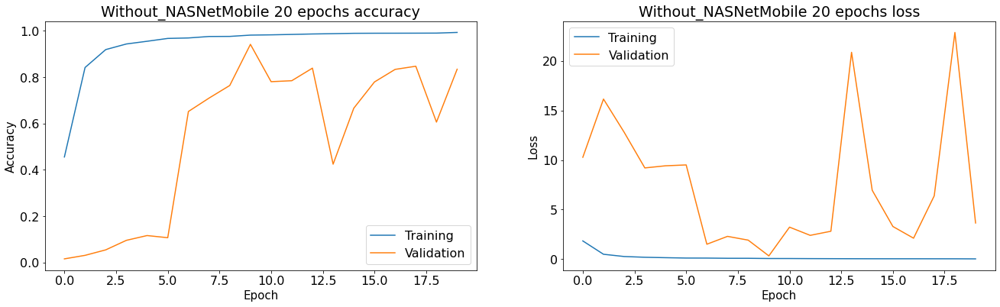

Predictions
405/405 [==============================] - 11s 15ms/step


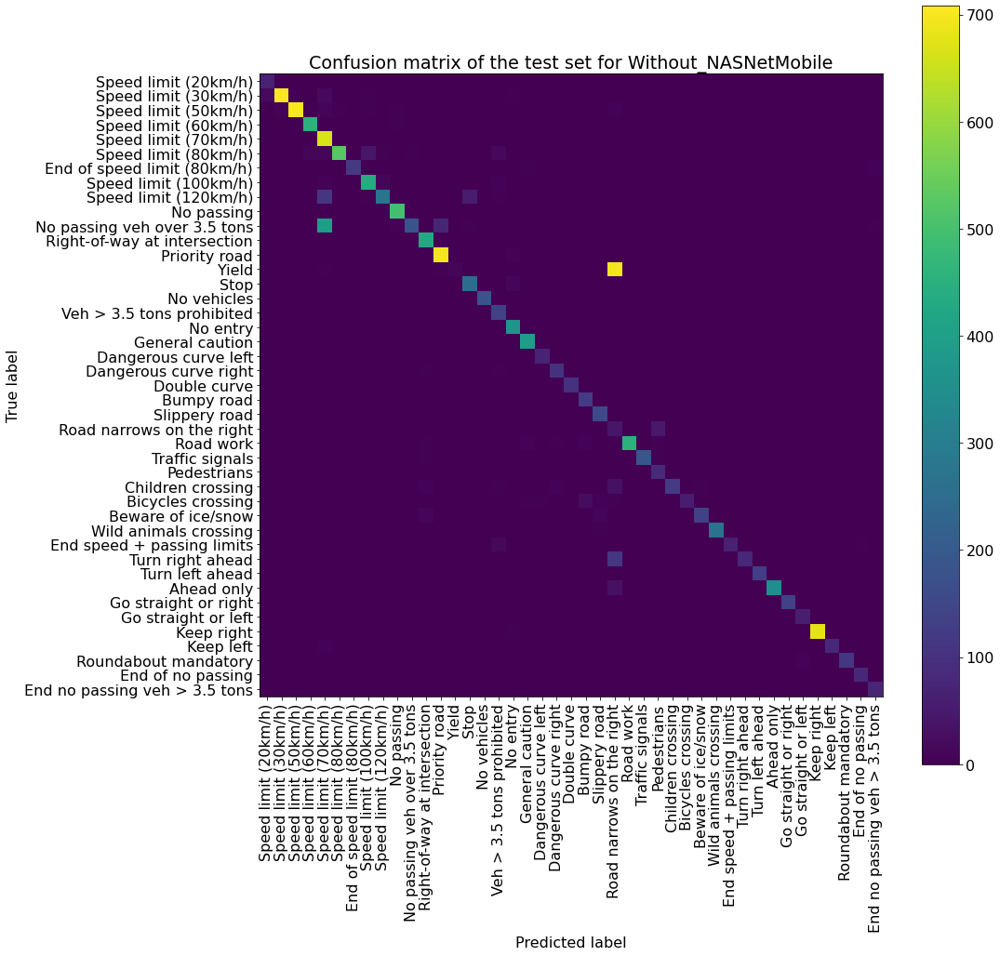

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.79      0.97      0.87        67
         Speed limit (30km/h)       0.99      0.94      0.96       757
         Speed limit (50km/h)       1.00      0.93      0.97       749
         Speed limit (60km/h)       0.96      0.97      0.96       470
         Speed limit (70km/h)       0.54      1.00      0.70       669
         Speed limit (80km/h)       0.98      0.85      0.91       617
  End of speed limit (80km/h)       1.00      0.89      0.94       133
        Speed limit (100km/h)       0.89      0.94      0.91       467
        Speed limit (120km/h)       0.94      0.60      0.73       453
                   No passing       0.96      0.99      0.98       498
 No passing veh over 3.5 tons       0.95      0.27      0.42       666
 Right-of-way at intersection       0.93      0.99      0.96       437
                Priority road       0.89      0.99      0.94       705
     

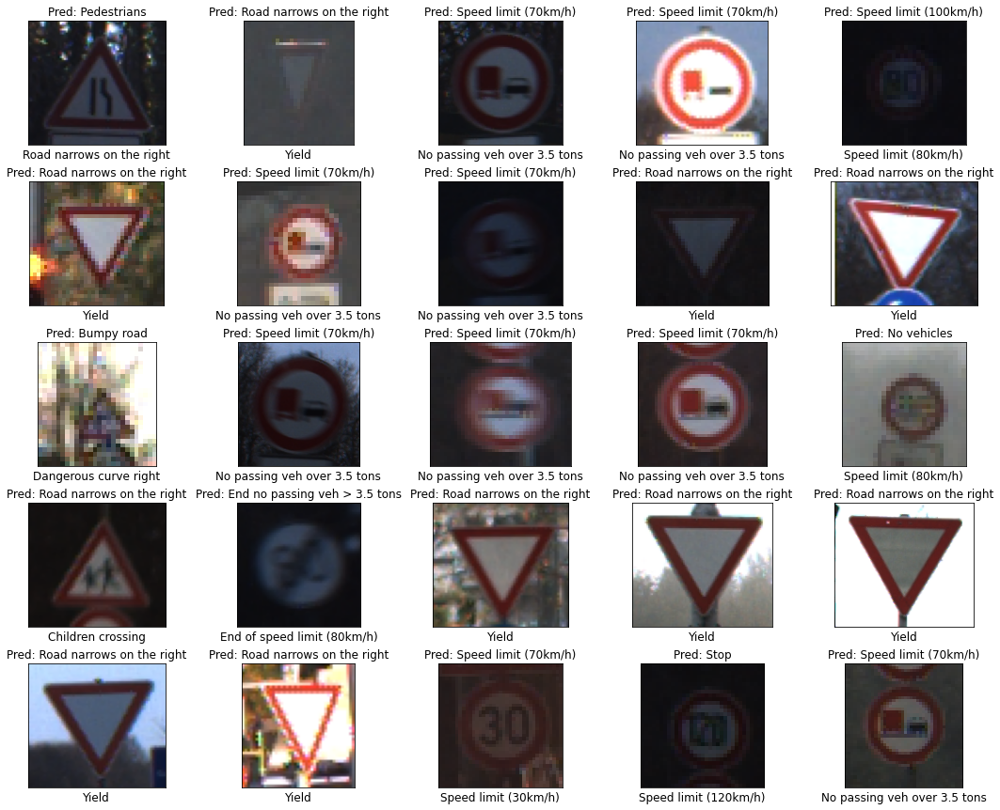

405/405 [==============================] - 12s 16ms/step - loss: 3.7097 - accuracy: 0.8365
CPU times: total: 17 s
Wall time: 30.7 s


In [48]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations :
- Validation score instable. 
- Overfitting
- Good test set accuracy (0.84)


### EfficientNetB0

#### Preprocessing

In [49]:
def preprocess_efficientnet(img_path):
    img = image.load_img(img_path, target_size=(width_im, height_im))
    x = image.img_to_array(img)
    x = efficientnet.preprocess_input(x)
    return list(x)

In [50]:
%%time
train_images=np.array([preprocess_efficientnet(path) for path in list(train_paths)])
test_images=np.array([preprocess_efficientnet(path) for path in list(test_paths)])

CPU times: total: 11.1 s
Wall time: 16.8 s


#### With pretrained weights

In [51]:
# n_model='With_EfficientNetB0'
# input_tensor = layers.Input(shape=(50, 50, 3))
# base_model = EfficientNetB0(input_tensor=input_tensor,weights='imagenet',include_top=False)
# x = base_model.output
# x = layers.GlobalAveragePooling2D()(x)

# predictions = layers.Dense(nb_classes, activation='softmax')(x)

# model=keras.models.Model(inputs=base_model.input, outputs=predictions)

# #Freeze the base model layers otherwise the weight will be updated
# for layer in base_model.layers:
#     layer.trainable = False

Compiling and fitting the model...
Epoch 1/20
1094/1094 [==============================] - 20s 13ms/step - loss: 1.4251 - accuracy: 0.5733 - val_loss: 0.9450 - val_accuracy: 0.7101
Epoch 2/20
1094/1094 [==============================] - 12s 11ms/step - loss: 0.8936 - accuracy: 0.7205 - val_loss: 0.7609 - val_accuracy: 0.7582
Epoch 3/20
1094/1094 [==============================] - 12s 11ms/step - loss: 0.7443 - accuracy: 0.7678 - val_loss: 0.6614 - val_accuracy: 0.7901
Epoch 4/20
1094/1094 [==============================] - 12s 11ms/step - loss: 0.6561 - accuracy: 0.7968 - val_loss: 0.6085 - val_accuracy: 0.8022
Epoch 5/20
1094/1094 [==============================] - 12s 11ms/step - loss: 0.6003 - accuracy: 0.8109 - val_loss: 0.5543 - val_accuracy: 0.8284
Epoch 6/20
1094/1094 [==============================] - 12s 11ms/step - loss: 0.5555 - accuracy: 0.8247 - val_loss: 0.5286 - val_accuracy: 0.8331
Epoch 7/20
1094/1094 [==============================] - 12s 11ms/step - loss: 0.5159 - ac

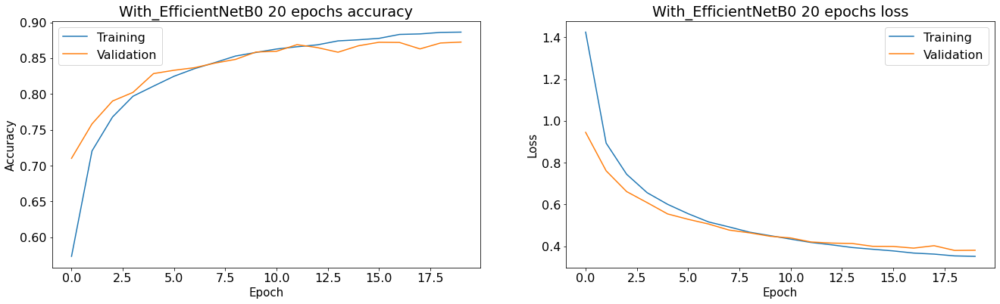

Predictions
405/405 [==============================] - 6s 7ms/step


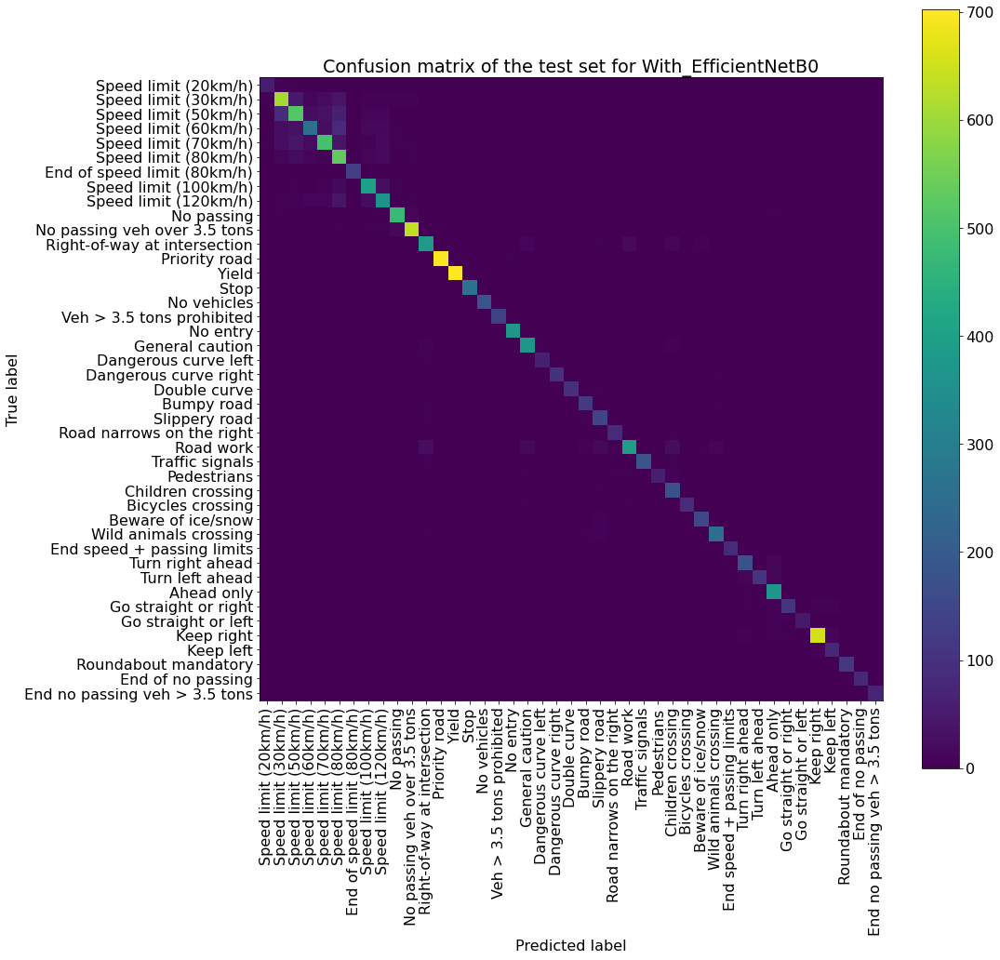

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.84      0.79      0.82        67
         Speed limit (30km/h)       0.78      0.80      0.79       757
         Speed limit (50km/h)       0.76      0.69      0.72       749
         Speed limit (60km/h)       0.77      0.55      0.64       470
         Speed limit (70km/h)       0.82      0.74      0.78       669
         Speed limit (80km/h)       0.65      0.86      0.74       617
  End of speed limit (80km/h)       0.95      0.98      0.96       133
        Speed limit (100km/h)       0.84      0.86      0.85       467
        Speed limit (120km/h)       0.78      0.79      0.79       453
                   No passing       0.92      0.95      0.93       498
 No passing veh over 3.5 tons       0.95      0.95      0.95       666
 Right-of-way at intersection       0.87      0.86      0.87       437
                Priority road       0.99      0.99      0.99       705
     

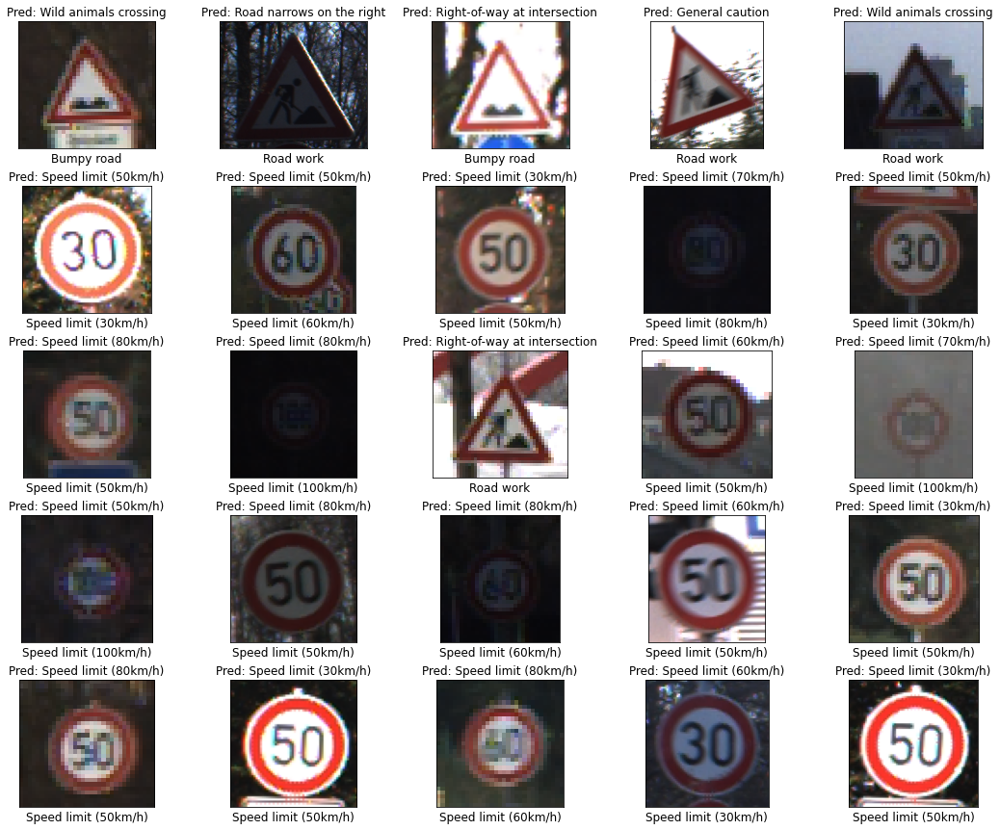

405/405 [==============================] - 4s 8ms/step - loss: 0.3779 - accuracy: 0.8758


NameError: name 'lst_acc' is not defined

In [52]:
# %%time
# df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

# df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
# df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)

Return error when saving the model:

TypeError: Unable to serialize [2.0896919 2.1128857 2.1081853] to JSON. Unrecognized type <class 'tensorflow.python.framework.ops.EagerTensor'>.

Val_acc = 0.87

No need to spend time to find a way fix it, the model isn't good enough 

#### Without pretrained weights

In [53]:
n_model='Without_EfficientNetB0'
model = EfficientNetB0(input_shape=(width_im,height_im,3),weights=None,classes=nb_classes)
print(model.summary())

Model: "efficientnetb0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 50, 50, 3)]  0           []                               
                                                                                                  
 rescaling_2 (Rescaling)        (None, 50, 50, 3)    0           ['input_12[0][0]']               
                                                                                                  
 normalization_1 (Normalization  (None, 50, 50, 3)   7           ['rescaling_2[0][0]']            
 )                                                                                                
                                                                                                  
 stem_conv_pad (ZeroPadding2D)  (None, 51, 51, 3)    0           ['normalization_1[0]

 block2b_expand_bn (BatchNormal  (None, 13, 13, 144)  576        ['block2b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block2b_expand_activation (Act  (None, 13, 13, 144)  0          ['block2b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block2b_dwconv (DepthwiseConv2  (None, 13, 13, 144)  1296       ['block2b_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block2b_bn (BatchNormalization  (None, 13, 13, 144)  576        ['block2b_dwconv[0][0]']         
 )        

 D)                                                              ']                               
                                                                                                  
 block3b_bn (BatchNormalization  (None, 7, 7, 240)   960         ['block3b_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block3b_activation (Activation  (None, 7, 7, 240)   0           ['block3b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block3b_se_squeeze (GlobalAver  (None, 240)         0           ['block3b_activation[0][0]']     
 agePooling2D)                                                                                    
          

                                                                                                  
 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block4b_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block4b_se_squeeze[0][0]']     
                                                                                                  
 block4b_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block4b_se_reshape[0][0]']     
                                                                                                  
 block4b_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block4b_se_reduce[0][0]']      
                                                                                                  
 block4b_s

                                                                                                  
 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     
                                                                                                  
 block5a_se_expand (Conv2D)     (None, 1, 1, 480)    10080       ['block5a_se_reduce[0][0]']      
                                                                                                  
 block5a_se_excite (Multiply)   (None, 4, 4, 480)    0           ['block5a_activation[0][0]',     
                                                                  'block5a_se_expand[0][0]']      
                                                                                                  
 block5a_project_conv (Conv2D)  (None, 4, 4, 112)    53760       ['block5a_se_excite[0][0]']      
                                                                                                  
 block5a_p

 block5c_project_bn (BatchNorma  (None, 4, 4, 112)   448         ['block5c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5c_drop (Dropout)         (None, 4, 4, 112)    0           ['block5c_project_bn[0][0]']     
                                                                                                  
 block5c_add (Add)              (None, 4, 4, 112)    0           ['block5c_drop[0][0]',           
                                                                  'block5b_add[0][0]']            
                                                                                                  
 block6a_expand_conv (Conv2D)   (None, 4, 4, 672)    75264       ['block5c_add[0][0]']            
                                                                                                  
 block6a_e

                                                                                                  
 block6c_expand_conv (Conv2D)   (None, 2, 2, 1152)   221184      ['block6b_add[0][0]']            
                                                                                                  
 block6c_expand_bn (BatchNormal  (None, 2, 2, 1152)  4608        ['block6c_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6c_expand_activation (Act  (None, 2, 2, 1152)  0           ['block6c_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6c_dwconv (DepthwiseConv2  (None, 2, 2, 1152)  28800       ['block6c_expand_activation[0][0]
 D)       

                                                                                                  
 block7a_expand_activation (Act  (None, 2, 2, 1152)  0           ['block7a_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block7a_dwconv (DepthwiseConv2  (None, 2, 2, 1152)  10368       ['block7a_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block7a_bn (BatchNormalization  (None, 2, 2, 1152)  4608        ['block7a_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block7a_a

Loading the model...


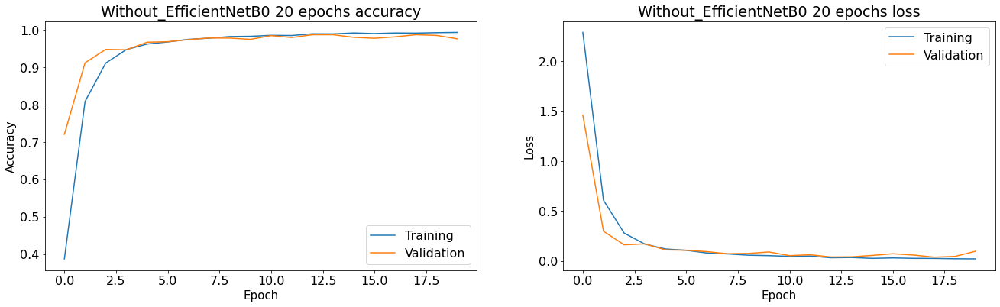

Predictions
405/405 [==============================] - 6s 8ms/step


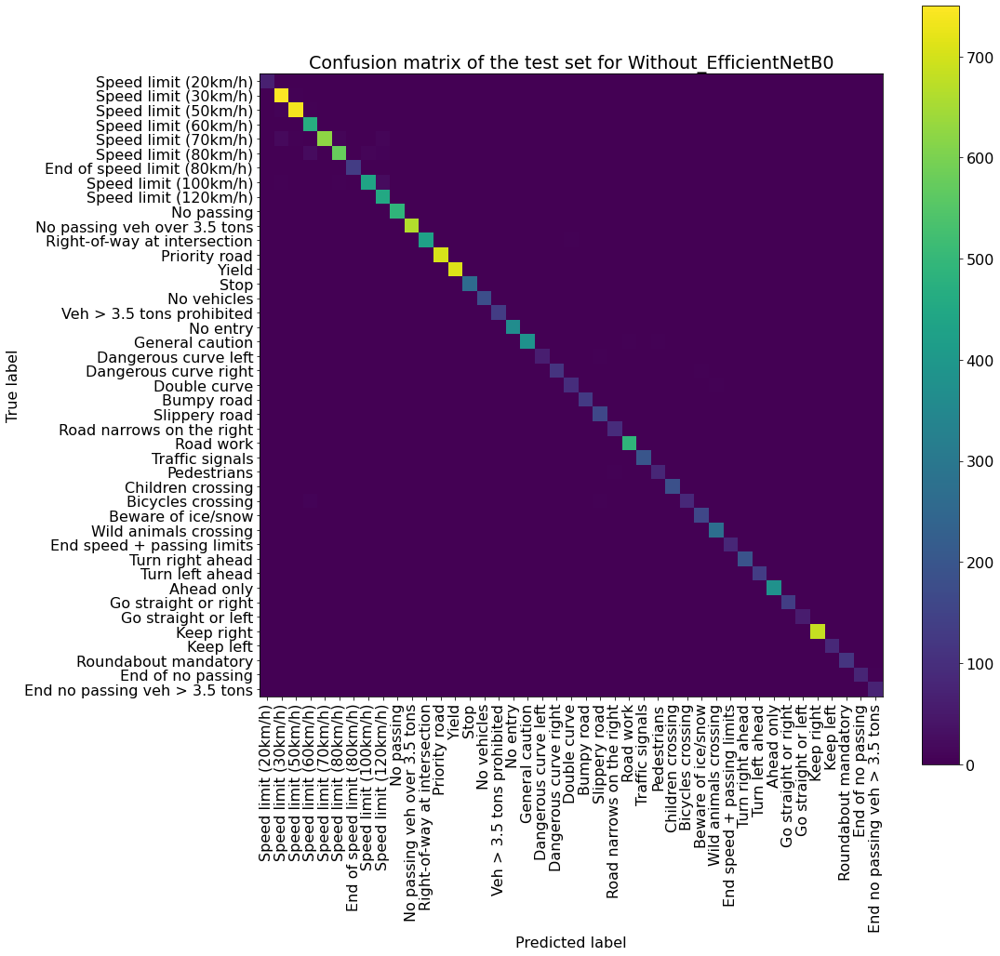

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.99      1.00      0.99        67
         Speed limit (30km/h)       0.96      0.99      0.97       757
         Speed limit (50km/h)       0.99      0.98      0.98       749
         Speed limit (60km/h)       0.93      1.00      0.96       470
         Speed limit (70km/h)       1.00      0.93      0.96       669
         Speed limit (80km/h)       0.97      0.93      0.95       617
  End of speed limit (80km/h)       0.98      1.00      0.99       133
        Speed limit (100km/h)       0.97      0.94      0.95       467
        Speed limit (120km/h)       0.91      1.00      0.95       453
                   No passing       0.99      0.99      0.99       498
 No passing veh over 3.5 tons       0.99      1.00      0.99       666
 Right-of-way at intersection       1.00      0.98      0.99       437
                Priority road       1.00      1.00      1.00       705
     

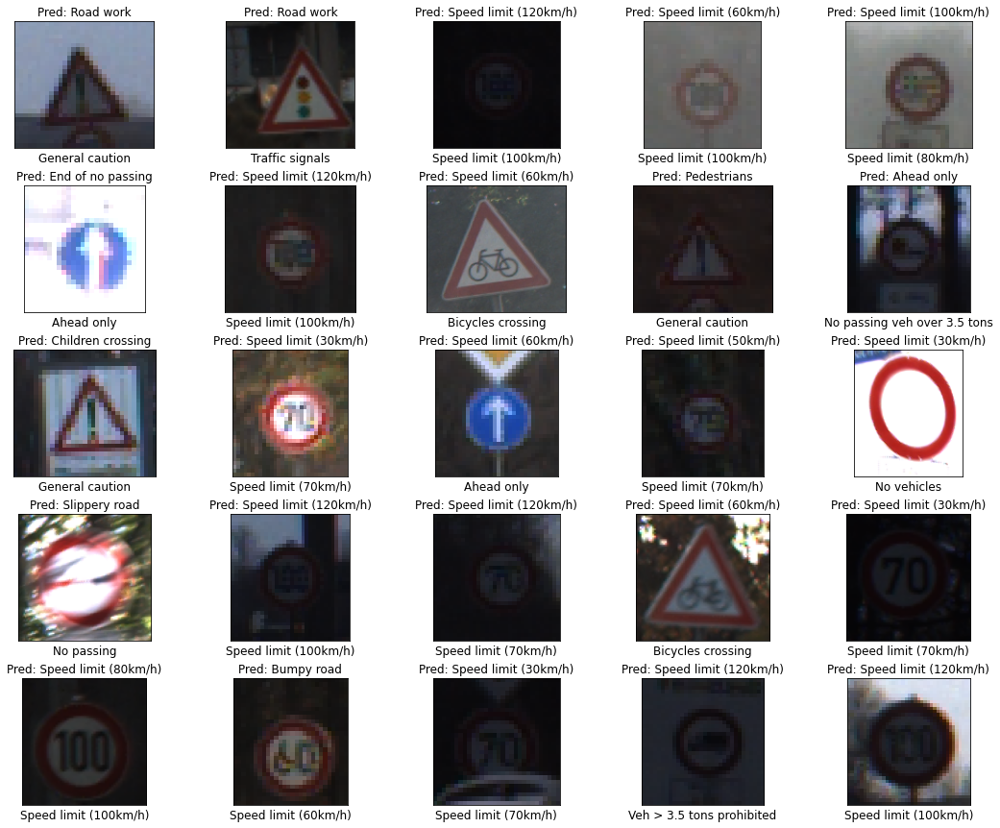

405/405 [==============================] - 7s 8ms/step - loss: 0.0813 - accuracy: 0.9811
CPU times: total: 9.73 s
Wall time: 16.7 s


In [54]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations :
- No sign of overfitting
- Great test set accuracy (0.98)

### EfficientNetV2B0

#### Preprocessing

In [55]:
def preprocess_efficientnet_v2(img_path):
    img = image.load_img(img_path, target_size=(width_im, height_im))
    x = image.img_to_array(img)
    x = efficientnet_v2.preprocess_input(x)
    return list(x)

In [56]:
%%time
train_images=np.array([preprocess_efficientnet_v2(path) for path in list(train_paths)])
test_images=np.array([preprocess_efficientnet_v2(path) for path in list(test_paths)])

CPU times: total: 10 s
Wall time: 17.3 s


#### With pretrained weights

In [57]:
n_model='With_EfficientNetV2B0'
input_tensor = layers.Input(shape=(50, 50, 3))
base_model = EfficientNetV2B0(input_tensor=input_tensor,weights='imagenet',include_top=False)
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)

predictions = layers.Dense(nb_classes, activation='softmax')(x)

model=keras.models.Model(inputs=base_model.input, outputs=predictions)

#Freeze the base model layers otherwise the weight will be updated
for layer in base_model.layers:
    layer.trainable = False

Loading the model...


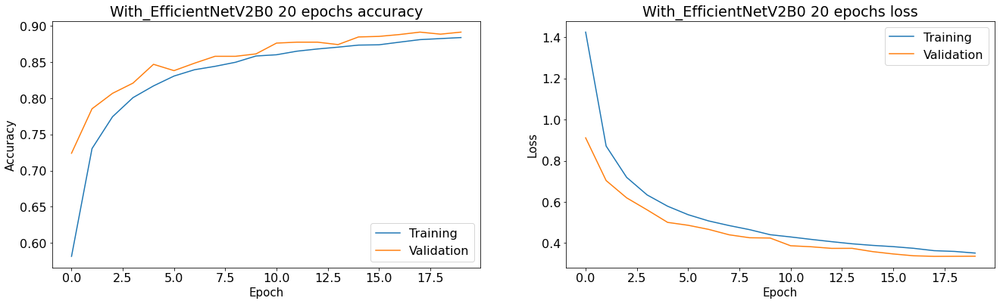

Predictions
405/405 [==============================] - 6s 7ms/step


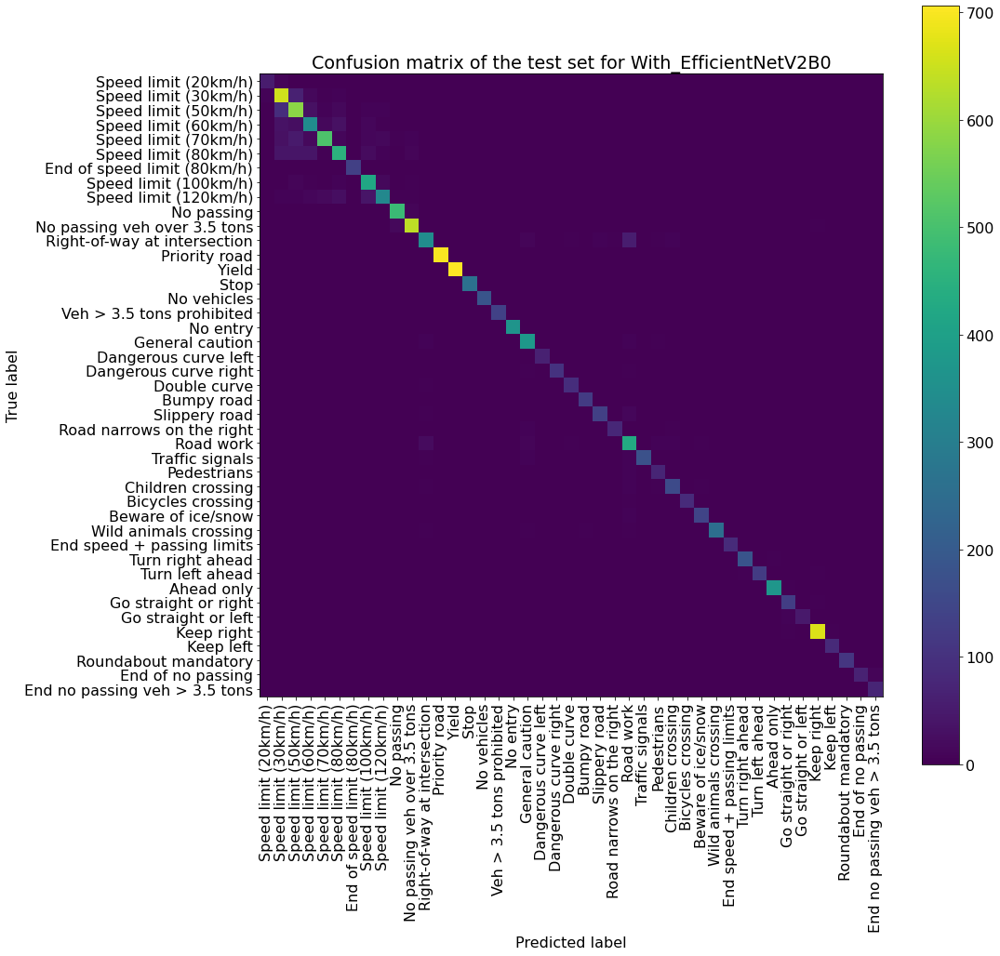

                               precision    recall  f1-score   support

         Speed limit (20km/h)       0.84      0.79      0.82        67
         Speed limit (30km/h)       0.75      0.86      0.80       757
         Speed limit (50km/h)       0.74      0.78      0.76       749
         Speed limit (60km/h)       0.73      0.73      0.73       470
         Speed limit (70km/h)       0.91      0.76      0.83       669
         Speed limit (80km/h)       0.81      0.74      0.77       617
  End of speed limit (80km/h)       0.98      1.00      0.99       133
        Speed limit (100km/h)       0.81      0.90      0.85       467
        Speed limit (120km/h)       0.87      0.73      0.79       453
                   No passing       0.94      0.97      0.95       498
 No passing veh over 3.5 tons       0.94      0.95      0.95       666
 Right-of-way at intersection       0.87      0.78      0.82       437
                Priority road       1.00      0.99      1.00       705
     

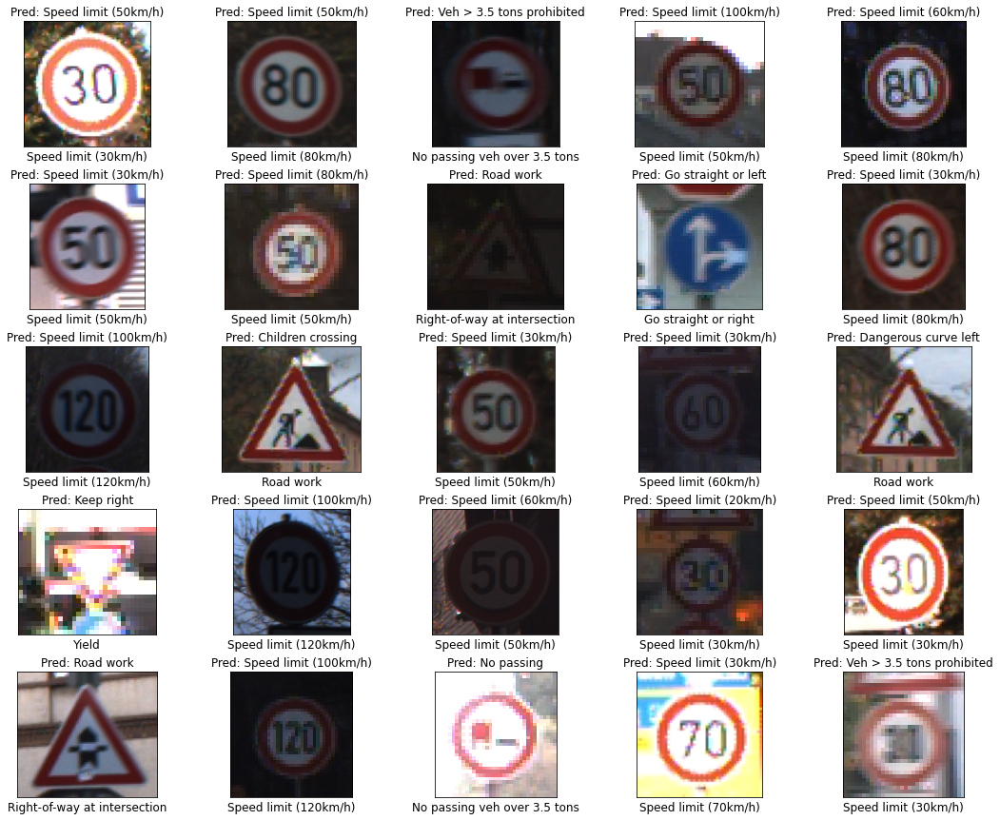

405/405 [==============================] - 6s 8ms/step - loss: 0.3404 - accuracy: 0.8900
CPU times: total: 9.22 s
Wall time: 16.7 s


In [58]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations : 

- No sign of overfitting 
- Big difficulty to predict correctly the speed limit signs
- Good test set accuracy (0.89)


#### Without pretrained weights

In [59]:
n_model='Without_EfficientNetV2B0'
model = EfficientNetV2B0(input_shape=(width_im,height_im,3),weights=None,classes=nb_classes)
print(model.summary())

Model: "efficientnetv2-b0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 50, 50, 3)]  0           []                               
                                                                                                  
 rescaling_4 (Rescaling)        (None, 50, 50, 3)    0           ['input_14[0][0]']               
                                                                                                  
 normalization_3 (Normalization  (None, 50, 50, 3)   0           ['rescaling_4[0][0]']            
 )                                                                                                
                                                                                                  
 stem_conv (Conv2D)             (None, 25, 25, 32)   864         ['normalization_3

 block3b_project_bn (BatchNorma  (None, 7, 7, 48)    192         ['block3b_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block3b_drop (Dropout)         (None, 7, 7, 48)     0           ['block3b_project_bn[0][0]']     
                                                                                                  
 block3b_add (Add)              (None, 7, 7, 48)     0           ['block3b_drop[0][0]',           
                                                                  'block3a_project_bn[0][0]']     
                                                                                                  
 block4a_expand_conv (Conv2D)   (None, 7, 7, 192)    9216        ['block3b_add[0][0]']            
                                                                                                  
 block4a_e

 block4c_expand_bn (BatchNormal  (None, 4, 4, 384)   1536        ['block4c_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block4c_expand_activation (Act  (None, 4, 4, 384)   0           ['block4c_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block4c_dwconv2 (DepthwiseConv  (None, 4, 4, 384)   3456        ['block4c_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block4c_bn (BatchNormalization  (None, 4, 4, 384)   1536        ['block4c_dwconv2[0][0]']        
 )        

 )                                                                                                
                                                                                                  
 block5b_activation (Activation  (None, 4, 4, 672)   0           ['block5b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5b_se_squeeze (GlobalAver  (None, 672)         0           ['block5b_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5b_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block5b_se_squeeze[0][0]']     
                                                                                                  
 block5b_s

 block5d_se_squeeze (GlobalAver  (None, 672)         0           ['block5d_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5d_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block5d_se_squeeze[0][0]']     
                                                                                                  
 block5d_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block5d_se_reshape[0][0]']     
                                                                                                  
 block5d_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5d_se_reduce[0][0]']      
                                                                                                  
 block5d_se_excite (Multiply)   (None, 4, 4, 672)    0           ['block5d_activation[0][0]',     
          

 block6a_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block6a_se_reshape[0][0]']     
                                                                                                  
 block6a_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block6a_se_reduce[0][0]']      
                                                                                                  
 block6a_se_excite (Multiply)   (None, 2, 2, 672)    0           ['block6a_activation[0][0]',     
                                                                  'block6a_se_expand[0][0]']      
                                                                                                  
 block6a_project_conv (Conv2D)  (None, 2, 2, 192)    129024      ['block6a_se_excite[0][0]']      
                                                                                                  
 block6a_project_bn (BatchNorma  (None, 2, 2, 192)   768         ['block6a_project_conv[0][0]']   
 lization)

 lization)                                                                                        
                                                                                                  
 block6c_drop (Dropout)         (None, 2, 2, 192)    0           ['block6c_project_bn[0][0]']     
                                                                                                  
 block6c_add (Add)              (None, 2, 2, 192)    0           ['block6c_drop[0][0]',           
                                                                  'block6b_add[0][0]']            
                                                                                                  
 block6d_expand_conv (Conv2D)   (None, 2, 2, 1152)   221184      ['block6c_add[0][0]']            
                                                                                                  
 block6d_expand_bn (BatchNormal  (None, 2, 2, 1152)  4608        ['block6d_expand_conv[0][0]']    
 ization) 

                                                                  'block6d_add[0][0]']            
                                                                                                  
 block6f_expand_conv (Conv2D)   (None, 2, 2, 1152)   221184      ['block6e_add[0][0]']            
                                                                                                  
 block6f_expand_bn (BatchNormal  (None, 2, 2, 1152)  4608        ['block6f_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6f_expand_activation (Act  (None, 2, 2, 1152)  0           ['block6f_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6f_d

 ization)                                                                                         
                                                                                                  
 block6h_expand_activation (Act  (None, 2, 2, 1152)  0           ['block6h_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6h_dwconv2 (DepthwiseConv  (None, 2, 2, 1152)  10368       ['block6h_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block6h_bn (BatchNormalization  (None, 2, 2, 1152)  4608        ['block6h_dwconv2[0][0]']        
 )                                                                                                
          

Loading the model...


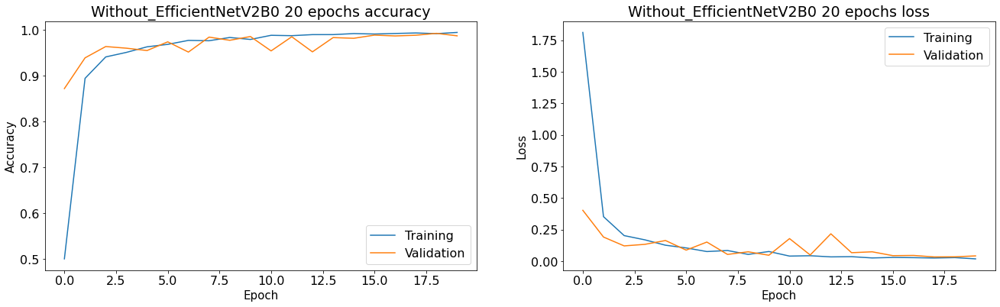

Predictions
405/405 [==============================] - 6s 7ms/step


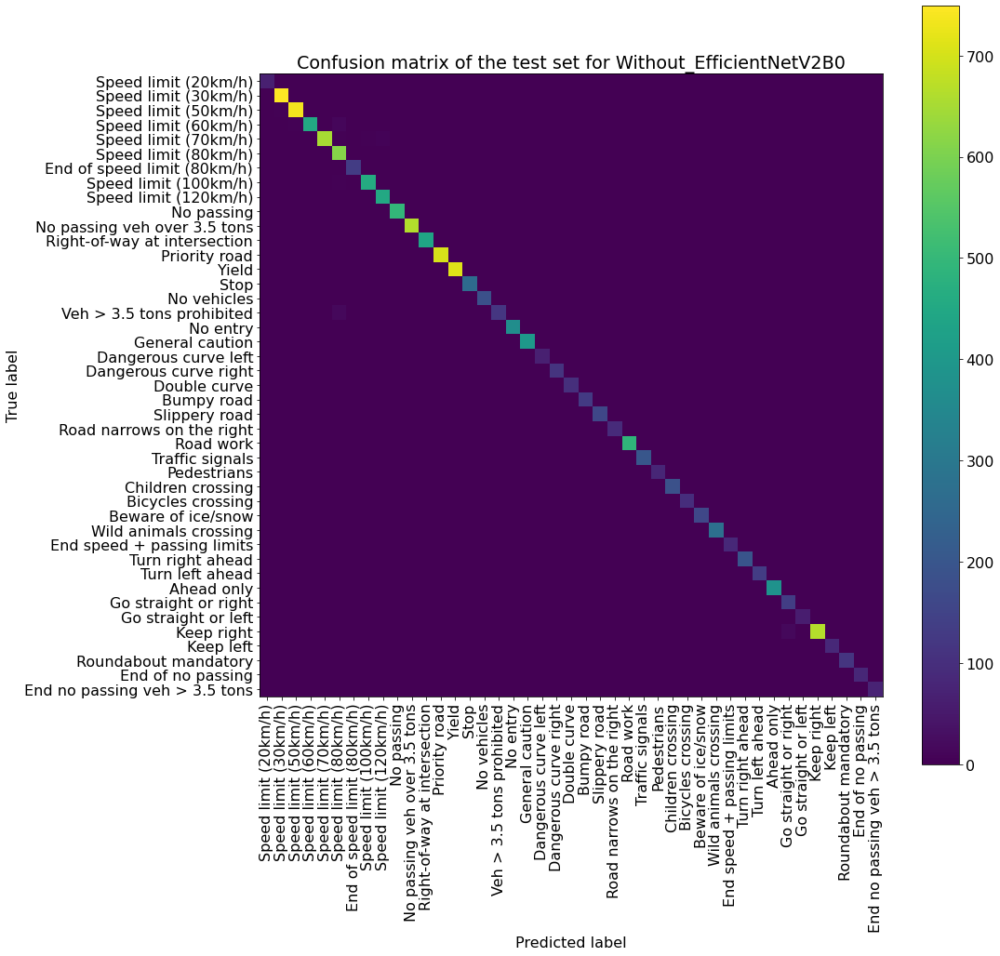

                               precision    recall  f1-score   support

         Speed limit (20km/h)       1.00      0.99      0.99        67
         Speed limit (30km/h)       0.99      0.99      0.99       757
         Speed limit (50km/h)       0.99      0.98      0.99       749
         Speed limit (60km/h)       1.00      0.96      0.98       470
         Speed limit (70km/h)       1.00      0.97      0.98       669
         Speed limit (80km/h)       0.94      0.99      0.96       617
  End of speed limit (80km/h)       1.00      1.00      1.00       133
        Speed limit (100km/h)       0.99      0.99      0.99       467
        Speed limit (120km/h)       0.97      1.00      0.98       453
                   No passing       1.00      1.00      1.00       498
 No passing veh over 3.5 tons       1.00      1.00      1.00       666
 Right-of-way at intersection       1.00      1.00      1.00       437
                Priority road       0.99      1.00      1.00       705
     

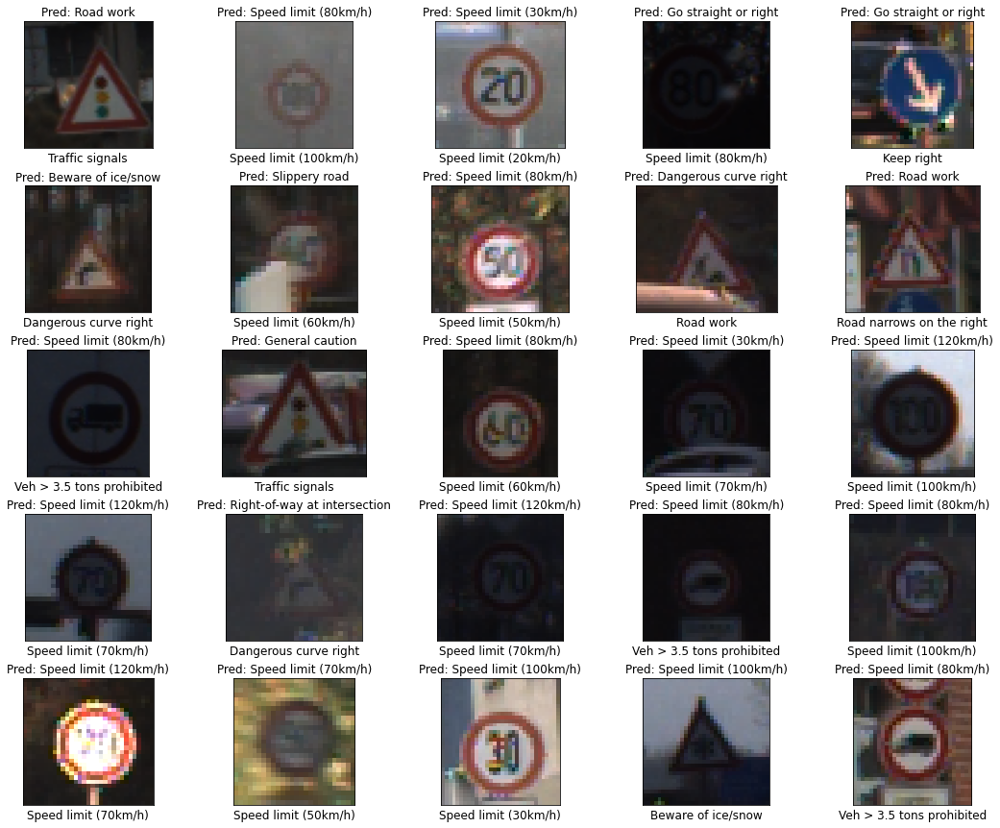

405/405 [==============================] - 6s 8ms/step - loss: 0.0442 - accuracy: 0.9883
CPU times: total: 8.88 s
Wall time: 16.4 s


In [60]:
%%time
df_acc, df_loss,test_acc=compile_fit_predict_plot(model)

df_train_accuracy=pd.concat([df_train_accuracy, df_acc], axis=1)
df_train_loss=pd.concat([df_train_loss, df_loss], axis=1)
dict_acc[n_model]=test_acc

Observations :
- Validation score instable during the 15 first epochs then stable
- No sign of overfitting
- Great test set accuracy (0.988)


## Choice of the best model for deployment

Now all the models are fitted and evaluated. Let's see which one is the best :

In [61]:
dict_acc

{'Simple_model': 0.989,
 'With_ResNet50': 0.866,
 'Without_ResNet50': 0.986,
 'With_VGG16': 0.761,
 'Without_VGG16': 0.053,
 'With_MobileNetV2': 0.799,
 'Without_MobileNetV2': 0.986,
 'With_Densenet121': 0.845,
 'Without_Densenet121': 0.994,
 'With_NASNetMobile': 0.678,
 'Without_NASNetMobile': 0.836,
 'Without_EfficientNetB0': 0.981,
 'With_EfficientNetV2B0': 0.89,
 'Without_EfficientNetV2B0': 0.988}

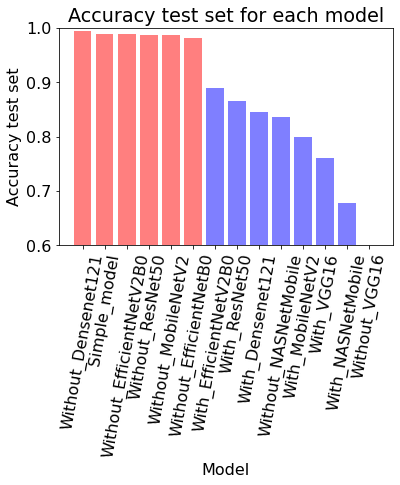

In [62]:
#Sort the dict in desc order
dict_acc=dict(sorted(dict_acc.items(), key=lambda item: item[1],reverse=True))

#Set the color (red if greater than 0.98 else blue)
color=['r' if c>=0.98 else 'b' for c in dict_acc.values()]

#Plot summary accuracy test set 
plt.bar(x=dict_acc.keys(),height=dict_acc.values(),color=color,alpha=0.5)
plt.xlabel('Model')
plt.ylabel('Accuracy test set')
plt.title('Accuracy test set for each model')
plt.xticks(rotation=80)
plt.ylim([0.6,1])

plt.show()

We have 6 models over 98% of accuracy for the test set. That's great!
For the deployment, we chose the fastest to compute of these 6 which is the **simple_model**

**GO TO PART 3 : DEPLOYMENT**

In [63]:
#Pickle all the results
df_train_accuracy.to_pickle(f'./results/df_train_accuracy_{nb_epoch}_epochs.pkl')
df_train_loss.to_pickle(f'./results/df_train_loss_{nb_epoch}_epochs.pkl')

with open(f"./Results/dict_test_acc_{nb_epoch}_epochs", "wb") as file:   #Pickling
    pickle.dump(dict_acc, file)